# Imports

In [2]:
import loompy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import pickle
from scipy.spatial.distance import pdist
from scipy.stats.mstats import zscore
from fastcluster import linkage
import polo # 
from polo import optimal_leaf_ordering #from polo import polo
#Paper: http://bioinformatics.oxfordjournals.org/content/17/suppl_1/S22.long
from scipy.cluster import hierarchy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import scipy
import LEBorm_functions as lb
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
plt.rcParams.update({'figure.max_open_warning': 150})

%matplotlib notebook

# Data

In [3]:
file_name = '/home/lars/storage/Documents/Cortex_FISH/CountsV1-1.loom'

def loompy2data(filename, cutoff_low, cutoff_high, molecules_low):
    """
    Loom file to Panda's dataframe. Perform size and count selection on cells
    Input:
    `filename`(str): Name and path tot the Loom file
    `cutoff_low`(flt): Minimal cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `cutoff_high`(flt): Max cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `molecules_low`(int): Minimal number of molecules
    Returns:
    Panda's dataframe with cells that passed the criteria. df has cell label as column name. 
    Some gene names are corrected
    Metadata is discarded. 
    
    """
    #Read loom file and import to Pandas df
    ds = loompy.connect(filename)
    df=pd.DataFrame(data=ds[:,:], columns=ds.col_attrs['CellID'], index=ds.row_attrs['genes']).astype(int)
    
    #Filter cell size
    for i, j in enumerate(ds.col_attrs['CellID']):
        if ds.col_attrs['CellArea'][i] < cutoff_low or ds.col_attrs['CellArea'][i] > cutoff_high:
            del df[j]
    
    #Filter total molecule count
    for i, j in enumerate(ds.col_attrs['CellID']):
        try: #not all 'CellID' are still present
            if df[j].sum() < molecules_low:
                del df[j]
        except Exception:
            pass
        
    #Filter bad hybridiztion4 (out of focus imaging) and repeat Tbr1
    bad_data = ['Hybridization4_Cnr1', 'Hybridization4_Plp1', 'Hybridization4_Vtn', 'Hybridization11_Tbr1']
    for i in bad_data:
        df.drop(i, inplace=True)
     
    #Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
    df= df.rename({'Hybridization11_Tmem6': 'Hybridization11_Tmem2', 'Hybridization12_Kcnip': 'Hybridization12_Kcnip2'})
    
    print('Selected cells with  {}>size<{} and a minimum molecule count of {} molecules'.format(cutoff_low, cutoff_high, molecules_low))
    print('Change incorrect names Tmem6-->Tmem2 and Kcnip-->2')
    return df

    
df_fish = loompy2data(file_name,2000, 60000, 20)
df_fish.shape

Selected cells with  2000>size<60000 and a minimum molecule count of 20 molecules
Change incorrect names Tmem6-->Tmem2 and Kcnip-->2


(35, 6036)

In [6]:
df_fish.values.flat[:]

array([13, 11, 28, ..., 33,  4,  1])

In [3]:
gene_sort = ['Gad2', 'Slc32a1', 'Crhbp', 'Kcnip2', 'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Klk6', 'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2',  'Lum'] 

gene_sort_wrong = ['Gad2', 'Slc32a1', 'Crhbp', 'Kcnip', 'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh', 
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem6',  'Ctps',  'Klk6', 'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2',  'Lum'] 


gene_sort_fish = ['Hybridization2_Gad2', 'Hybridization12_Slc32a1', 'Hybridization10_Crhbp', 'Hybridization12_Kcnip2', 'Hybridization13_Cnr1', 'Hybridization6_Vip', 'Hybridization5_Cpne5', 'Hybridization8_Pthlh',  'Hybridization10_Crh', 
'Hybridization1_Tbr1', 'Hybridization9_Lamp5', 'Hybridization7_Rorb', 'Hybridization11_Syt6',
'Hybridization1_Aldoc', 'Hybridization2_Gfap', 'Hybridization8_Serpinf1', 'Hybridization3_Mfge8',
 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization8_Pdgfra', 'Hybridization6_Bmp4','Hybridization6_Itpr2','Hybridization11_Tmem2', 'Hybridization7_Ctps','Hybridization5_Klk6','Hybridization9_Anln',
 'Hybridization3_Mrc1','Hybridization3_Hexb', 
 'Hybridization13_Ttr',
 'Hybridization1_Foxj1',
 'Hybridization12_Vtn',
 'Hybridization2_Flt1',
 'Hybridization10_Apln',
 'Hybridization5_Acta2',
 'Hybridization9_Lum']


#Make conversion dictionary with gene names and corresponding HybridizationX_geneY names

gene_name_conversion = {}

for i in gene_sort:
    for j in df_fish.index:
        if j.endswith(i):
            gene_name_conversion[j] =i
            
gene_name_conversion_reverse = dict((v,k) for k,v in gene_name_conversion.items())
            

In [4]:
#Open object properties
obj_prop = pickle.load(open("ObjProp_dict.pkl", 'rb'))

#Load cell ID and XY coordinates into a list
coord_list = []
for i in obj_prop:
    coord_list.append([i, obj_prop[i]['obj_centroid'][0], obj_prop[i]['obj_centroid'][1]])
    
#Place cell ID and X and Y coordinates into dataframe
coord_df = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T
coord_df = coord_df.loc[:,df_fish.columns]

In [8]:
df_fish = df_fish.loc[gene_sort_fish,:]

#Transform data
X = df_fish.values.astype(np.float64)
    #Sqrt normalize
X_sqrt = np.sqrt(X)
    #Mean normalize
X_norm = X.sum(0).mean() * (X/X.sum(0))
    #Log transform
X_log = np.log2(X_norm+1)
    #Z-score
X_z = zscore(X, axis=1)

    #Build dataframes of normalized and log transformed data
df_fish_sqrt = pd.DataFrame(data=X_sqrt, columns=df_fish.columns, index=df_fish.index)
df_fish_norm = pd.DataFrame(data=X_norm, columns=df_fish.columns, index=df_fish.index)
df_fish_log = pd.DataFrame(data=X_log, columns=df_fish.columns, index=df_fish.index)
df_fish_z = pd.DataFrame(data=X_z, columns=df_fish.columns, index=df_fish.index)

#Devide by size
area_df_fish = np.array([(np.sqrt(obj_prop[c]['obj_area'])*0.065)**2 for c in df_fish.columns])
X_size = X/area_df_fish
    #Sqrt normalize
X_size_sqrt = np.sqrt(X_size)
    #Mean normalize
X_size_norm = X_size.sum(0).mean() * (X_size/X_size.sum(0))
    #Log transform
X_size_log = np.log2(X_size_norm+1)

    #Build dataframes of normalized and log transformed data
df_fish_size_sqrt = pd.DataFrame(data=X_size_sqrt, columns=df_fish.columns, index=df_fish.index)
df_fish_size_norm = pd.DataFrame(data=X_size_norm, columns=df_fish.columns, index=df_fish.index)
df_fish_size_log = pd.DataFrame(data=X_size_log, columns=df_fish.columns, index=df_fish.index)

#Total molecule per cell corrected 
df_fish_mol = (df_fish / df_fish.sum()) * 100
df_fish_mol_log = np.log2(df_fish_mol + 1)

#Total molecule per GENE and per CELL corrected
df_fish_totmol = df_fish.divide(df_fish.sum(axis=1), axis=0) * df_fish.shape[0] #Corrected for total molecules per gene
df_fish_totmol = df_fish_totmol.divide(df_fish_totmol.sum(axis=0), axis=1) * df_fish.shape[1] #Corrected for the total per cell

#Calculate the fold change dataframe
df_fish_fc = df_fish.loc[gene_sort_fish,:]
mean_expression_for_fc =  df_fish.loc[gene_sort_fish,:].T.mean()
df_fish_fc = df_fish_fc.divide(mean_expression_for_fc, axis='rows')

X_fc = df_fish_fc.values

NameError: name 'gene_sort_fish' is not defined

In [2592]:
df_fish_totmol

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,5162,532,3607,3251,7173,2757,1228,1234,7797,4653
Hybridization2_Gad2,59.097363,134.832042,68.620327,70.789709,634.761084,87.098014,153.993551,18.144337,31.940752,105.881257,...,51.500036,133.533634,103.633295,35.458330,31.192269,32.304901,58.069634,156.791371,102.966098,216.161380
Hybridization12_Slc32a1,45.000240,89.835481,121.920377,75.464881,572.577649,0.000000,58.629915,0.000000,85.125546,0.000000,...,0.000000,59.313587,30.688211,0.000000,0.000000,172.192083,0.000000,0.000000,0.000000,0.000000
Hybridization10_Crhbp,88.751819,0.000000,120.228861,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,139.134971,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Hybridization12_Kcnip2,6.062614,605.149902,821.280234,142.337062,42.076347,187.637373,315.954340,182.414340,80.279197,0.000000,...,462.282422,367.584416,529.208251,0.000000,22.399422,23.198411,0.000000,0.000000,73.940791,310.454484
Hybridization13_Cnr1,20.810705,83.090210,112.766021,488.590357,1348.036639,644.089532,325.366231,313.080398,196.834798,65.249296,...,190.421298,164.580132,709.599886,43.702373,76.888910,119.447318,0.000000,0.000000,0.000000,290.638673
Hybridization6_Vip,315.666957,96.950227,131.576168,162.883024,842.624145,250.509362,189.819776,104.372674,45.933639,101.511102,...,0.000000,704.121834,66.237281,254.961142,44.857254,325.201217,334.037167,150.319946,592.297583,56.519867
Hybridization5_Cpne5,0.000000,537.379320,91.163159,56.427130,38.921070,0.000000,175.356685,650.835825,127.301340,0.000000,...,307.883649,0.000000,458.928081,0.000000,186.477342,0.000000,0.000000,0.000000,410.376132,1253.121666
Hybridization8_Pthlh,171.875731,0.000000,0.000000,0.000000,795.245874,0.000000,223.933462,184.695199,0.000000,0.000000,...,0.000000,0.000000,117.211789,180.469071,0.000000,0.000000,0.000000,0.000000,349.371523,0.000000
Hybridization10_Crh,124.855230,0.000000,338.273677,0.000000,216.633128,0.000000,976.028328,134.167641,0.000000,130.489185,...,190.407571,164.568268,85.145848,131.097667,0.000000,0.000000,0.000000,386.462698,253.793024,0.000000
Hybridization1_Tbr1,85.087324,287.459890,496.524873,131.714267,52.996407,405.145437,238.772319,337.601055,61.906549,20.521568,...,1137.899322,345.080853,232.103448,109.958731,60.455864,62.612330,0.000000,189.085894,478.957475,76.174019


<IPython.core.display.Javascript object>


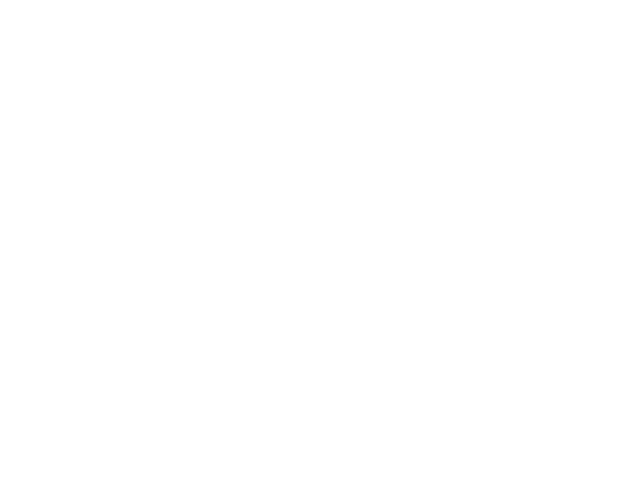

NameError: name 'df_fish_size_log' is not defined

In [7]:
plt.figure()
plt.hist(df_fish_size_log.iloc[34], bins=50);

# Test dataset

In [6]:
olig_id = pickle.load(open("oligodendrocytes.p", 'rb'))
df_olig = df_fish_size_sqrt.loc[:,olig_id]

In [7]:
df_olig.head(5)

,994,2872,5434,4234,2913,3230,2288,4495,4123,5302,...,6581,3075,1024,2314,1101,2808,3251,2757,1228,1234
Hybridization2_Gad2,0.199621,0.117908,0.202330,0.210055,0.204283,0.215823,0.185290,0.568956,0.696480,0.233374,...,0.275208,0.433273,0.409246,0.377686,0.349566,0.000000,0.124412,0.157064,0.224959,0.36652
Hybridization12_Slc32a1,0.000000,0.000000,0.116815,0.105027,0.000000,0.000000,0.000000,0.000000,0.372284,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.180515,0.105712,0.000000,0.222121,0.000000,0.00000
Hybridization10_Crhbp,0.115251,0.117908,0.286138,0.000000,0.166796,0.000000,0.000000,0.000000,0.322407,0.000000,...,0.000000,0.000000,0.105667,0.000000,0.180515,0.105712,0.000000,0.000000,0.000000,0.00000
Hybridization12_Kcnip2,0.000000,0.166747,0.165202,0.000000,0.000000,0.000000,0.106977,0.164243,0.372284,0.000000,...,0.275208,0.000000,0.105667,0.000000,0.156331,0.183098,0.000000,0.157064,0.000000,0.00000
Hybridization13_Cnr1,0.199621,0.204223,0.233630,0.148531,0.166796,0.000000,0.354803,0.284478,0.263245,0.104368,...,0.000000,0.000000,0.236278,0.000000,0.156331,0.211424,0.087972,0.192363,0.000000,0.00000


In [8]:
def cluster_binarity(df, labels, cluster_of_interest, cutoff_expression, cutoff_percentage):
    """
    Calculates the percentage of cells, of a given cluster_of_interest in a df, 
    that have an expression above the cutoff_expression. It returns a pandas 
    Series with the percentages and it returns the names of the genes that have
    a percentage higher than the cutoff_percentage.
    Input:
    `df`(pandas dataframe): df of the cells that were clusterd.
    `labels`(numpy array): Cluster labels of the clustering, in same order as df.
    `cluster_of_interest`(int): Cluster of interest from the labels.
    `cutoff_expression`(float): used to make a binarization and is the same for
        all genes. Data normalization is very important!
    `cutoff_percentage`(float): Percentage of cells that need to be 'positive'
        in the cluster. 
    Returns:
    *Pandas series with the percentages for all genes
    *List of names of genes with a percentage higher than the cutoff_percentage
    
    """
    filt = labels == cluster_of_interest
    df = df.loc[:,filt]
    
    #Calculate percentage of cells that are above the cutoff
        #Percentage of cells that are above cutoff_expression
    positive = (df[df>cutoff_expression].T.count() / df.shape[1]) * 100
        #Genes that are considered positive above the cutoff_percentage
    positive_genes = [positive.index[i] for i,n in enumerate(positive) if n>cutoff_percentage]
    return positive, positive_genes

In [26]:
def gini(array):
    #Function from:
    #https://github.com/oliviaguest/gini/blob/master/gini.py
    """Calculate the Gini coefficient of a numpy array."""
    # based on bottom eq:
    # http://www.statsdirect.com/help/generatedimages/equations/equation154.svg
    # from:
    # http://www.statsdirect.com/help/default.htm#nonparametric_methods/gini.htm
    # All values are treated equally, arrays must be 1d:
    array = array.flatten()
    if np.amin(array) < 0:
        # Values cannot be negative:
        array -= np.amin(array)
    # Values cannot be 0:
    array += 0.0000001
    # Values must be sorted:
    array = np.sort(array)
    # Index per array element:
    index = np.arange(1,array.shape[0]+1)
    # Number of array elements:
    n = array.shape[0]
    # Gini coefficient:
    return ((np.sum((2 * index - n  - 1) * array)) / (n * np.sum(array)))

Order of clusters: [0, 1]


<IPython.core.display.Javascript object>


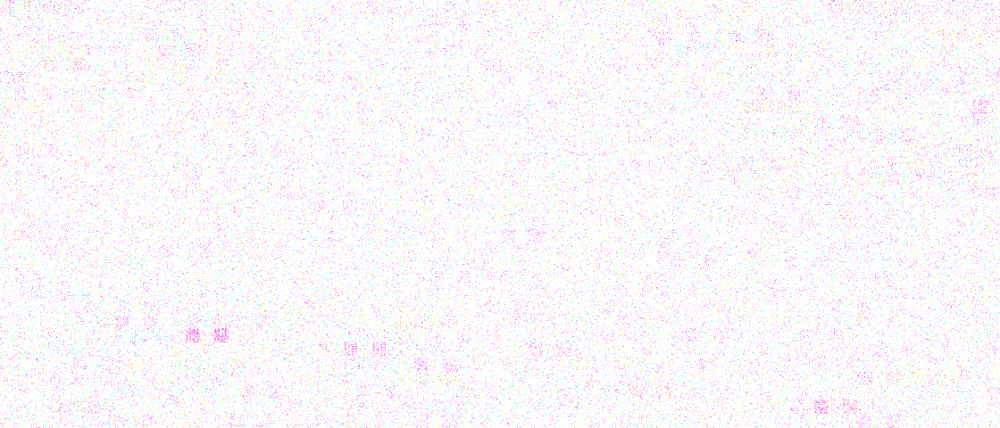

(35, 848)
848
['Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1']


['Hybridization7_Sox10', 'Hybridization13_Plp1']




In [44]:
split = AgglomerativeClustering(n_clusters=2).fit(df_olig.T)
#cell_labels, label_cells, cellID, labels, labels_a = lb.gen_labels(df_olig, split)

cluster_order = lb.heat_map(df_olig, split.labels_)

for l in cluster_order:
    print(cluster_binarity(df_olig, split.labels_, l, 0.25, 80)[1])
    print('\n')

Order of clusters: [0, 1, 2]


<IPython.core.display.Javascript object>


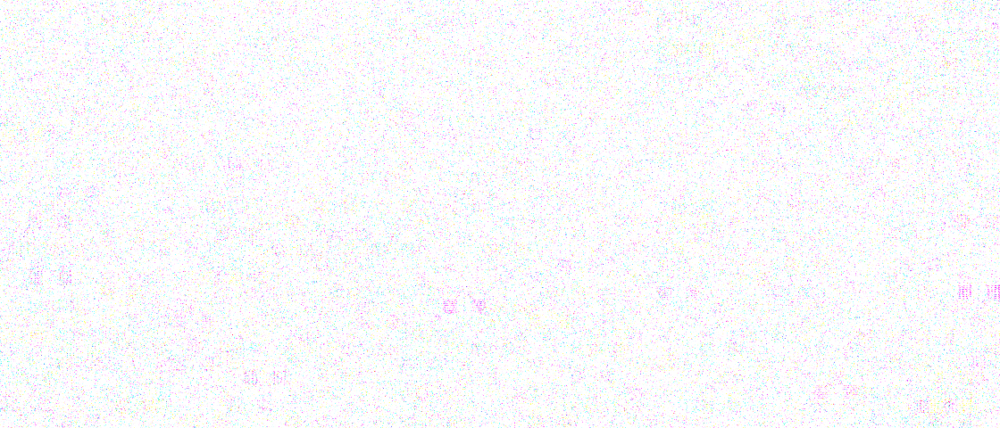

(35, 848)
848
['Hybridization7_Sox10', 'Hybridization13_Plp1']


['Hybridization7_Sox10', 'Hybridization13_Plp1']


['Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']




In [32]:
split = AgglomerativeClustering(n_clusters=3).fit(df_olig.T)
#cell_labels, label_cells, cellID, labels, labels_a = lb.gen_labels(df_olig, split)

cluster_order = lb.heat_map(df_olig, split.labels_)

for l in cluster_order:
    print(cluster_binarity(df_olig, split.labels_, l, 0.275, 80)[1])
    print('\n')

Order of clusters: [3, 1, 0, 2]


<IPython.core.display.Javascript object>


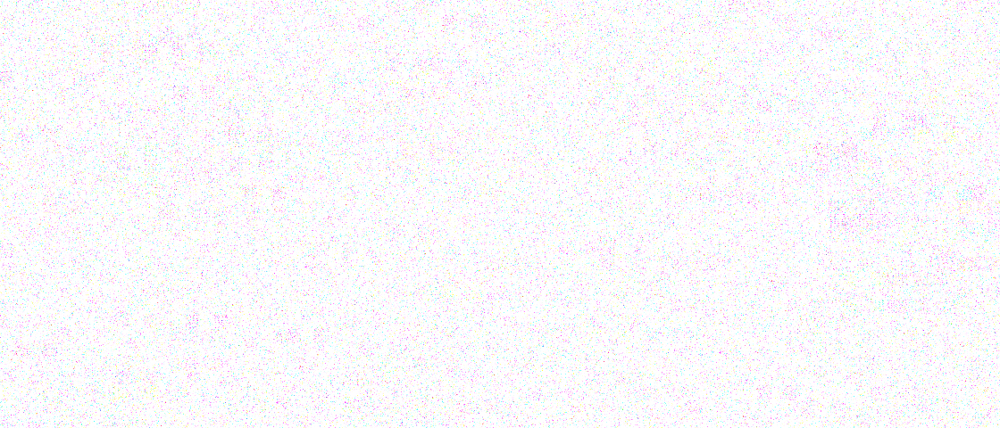

(35, 848)
848
['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Itpr2', 'Hybridization11_Tmem2']


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Bmp4']


['Hybridization7_Sox10', 'Hybridization13_Plp1']


['Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']




In [33]:
split = AgglomerativeClustering(n_clusters=4).fit(df_olig.T)
#cell_labels, label_cells, cellID, labels, labels_a = lb.gen_labels(df_olig, split)

cluster_order = lb.heat_map(df_olig, split.labels_)

for l in cluster_order:
    print(cluster_binarity(df_olig, split.labels_, l, 0.275, 80)[1])
    print('\n')

Order of clusters: [3, 4, 1, 2, 0]


<IPython.core.display.Javascript object>


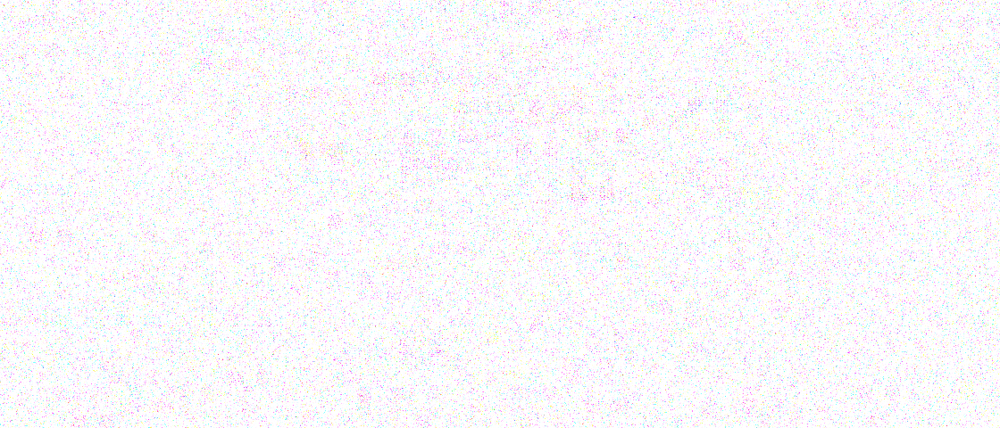

(35, 848)
848
['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Itpr2', 'Hybridization11_Tmem2']


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Bmp4']


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']


['Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']


['Hybridization7_Sox10', 'Hybridization13_Plp1']




In [34]:
split = AgglomerativeClustering(n_clusters=5).fit(df_olig.T)
#cell_labels, label_cells, cellID, labels, labels_a = lb.gen_labels(df_olig, split)

cluster_order = lb.heat_map(df_olig, split.labels_)

for l in cluster_order:
    print(cluster_binarity(df_olig, split.labels_, l, 0.275, 80)[1])
    print('\n')

Order of clusters: [3, 0, 2, 1, 5, 4]


<IPython.core.display.Javascript object>


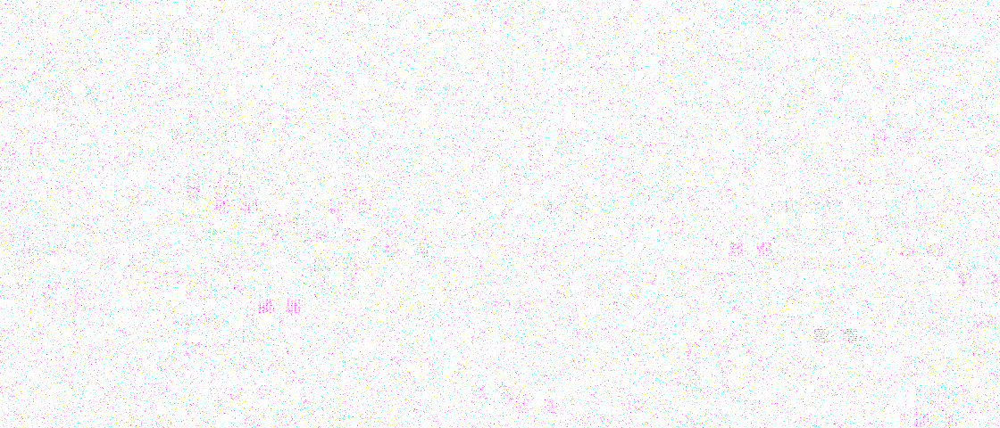

(35, 848)
848
['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Itpr2', 'Hybridization11_Tmem2']
0.530242270774


['Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']
0.422257299666


['Hybridization7_Sox10', 'Hybridization13_Plp1']
0.607426945274


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']
0.614937969074


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization7_Ctps']
0.597309059726


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Bmp4']
0.542729304767




In [35]:
split = AgglomerativeClustering(n_clusters=6).fit(df_olig.T)
#cell_labels, label_cells, cellID, labels, labels_a = lb.gen_labels(df_olig, split)

cluster_order = lb.heat_map(df_olig, split.labels_)

for l in cluster_order:
    print(cluster_binarity(df_olig, split.labels_, l, 0.275, 80)[1])
    print(gini(np.array(cluster_binarity(df_olig, split.labels_, l, 0.25, 80)[0])))
    print('\n')

Order of clusters: [4, 2, 0, 5, 1, 6, 3]


<IPython.core.display.Javascript object>


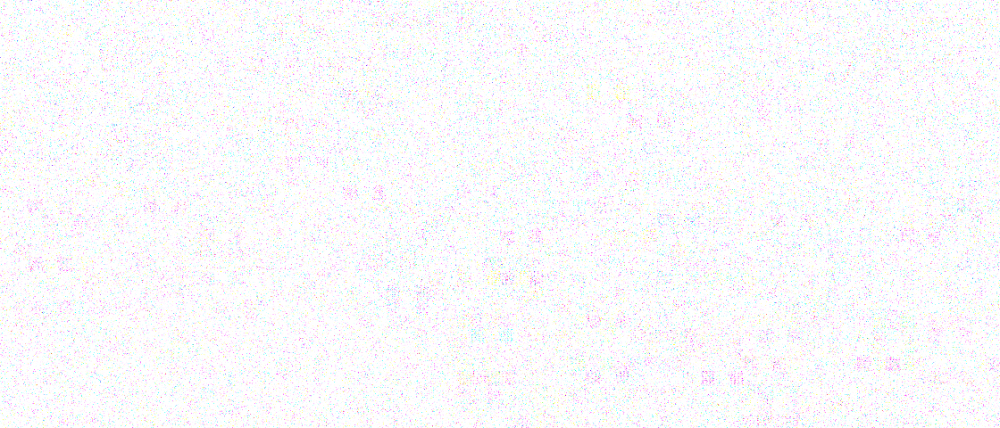

(35, 848)
848
['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Bmp4']


['Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']


['Hybridization7_Sox10', 'Hybridization13_Plp1']


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization7_Ctps']


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln']


['Hybridization2_Gad2', 'Hybridization6_Vip', 'Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization9_Anln', 'Hybridization3_Mrc1', 'Hybridization5_Acta2']


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Itpr2', 'Hybridization11_Tmem2']




In [36]:
split = AgglomerativeClustering(n_clusters=7).fit(df_olig.T)
#cell_labels, label_cells, cellID, labels, labels_a = lb.gen_labels(df_olig, split)

cluster_order = lb.heat_map(df_olig, split.labels_)

for l in cluster_order:
    print(cluster_binarity(df_olig, split.labels_, l, 0.275, 80)[1])
    print('\n')

Order of clusters: [8, 10, 18, 15, 5, 12, 3, 17, 4, 7, 6, 11, 2, 0, 1, 14, 9, 19, 16, 13]


<IPython.core.display.Javascript object>


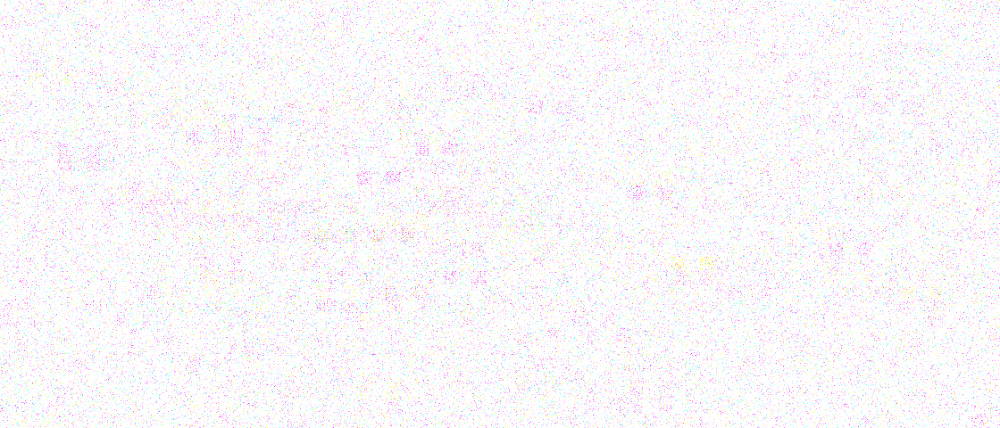

(35, 848)
848
['Hybridization2_Gad2', 'Hybridization6_Vip', 'Hybridization1_Tbr1', 'Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization9_Anln', 'Hybridization3_Mrc1', 'Hybridization5_Acta2']
0.449219686818


['Hybridization6_Vip', 'Hybridization1_Tbr1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization7_Ctps', 'Hybridization1_Foxj1', 'Hybridization12_Vtn']
0.455205810058


['Hybridization1_Tbr1', 'Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization9_Anln', 'Hybridization10_Apln']
0.434406437615


['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Bmp4']
0.608578180831


['Hybridization1_Tbr1', 'Hybridization8_Serpinf1', 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization6_Itpr2', 'Hybridization11_Tmem2', 'Hybridization9_Anln']
0.510635869759


['Hybridization1_Tbr1', 'Hybridization7_Sox10']
0.659535535397


['Hybridization7_Sox10', 'Hybridization13_Plp1']
0.606648694344


['Hybridization7_Sox10', 'H

In [30]:
split = AgglomerativeClustering(n_clusters=20).fit(df_olig.T)
#cell_labels, label_cells, cellID, labels, labels_a = lb.gen_labels(df_olig, split)

cluster_order = lb.heat_map(df_olig, split.labels_)

for l in cluster_order:
    print(cluster_binarity(df_olig, split.labels_, l, 0.25, 80)[1])
    print(gini(np.array(cluster_binarity(df_olig, split.labels_, l, 0.25, 80)[0])))
    print('\n')

# Iterative clustering

In [2024]:
df = df_fish_totmol

In [2018]:
#Format:
#cluster_tree['LevelX_xxx'] = [[Cells], [labels], correlation, [p-values difference in expression]]
#    cells: List of all cells in this level
#    labels: Cluster labels of the cells after the split
#    correlation: Correlation coeficient r of the means of the two new clusters
#    p-values: MWU rank sum test p-values in gene expression. List of p-values for each gene compared between the two clusters.
#           None if both clusters have zeros for that gene


depth = 15
df = df_fish_totmol

cluster_tree = {'Level0_' : [df.columns] } #np.zeros((1,len(df_olig.columns)))]
level_cells = {}
last_clusters = []

def MWU(df0, df1):
    pval = []
    for i in df0.index:
        #if (df0.loc[i] == 0).all() and (df1.loc[i] == 0).all():
        if (df0.loc[i].mean() == df1.loc[i].mean()):
            print('equal_mean')
            pval.append([None, None])
        else:
            pval.append(scipy.stats.mannwhitneyu(df0.loc[i], df1.loc[i], alternative='two-sided'))
    return pval

for i in range(depth):
    for parent in [ k for k,v in cluster_tree.items() if 'Level{}'.format(i) in k]:
        #cluster parent
        cells = cluster_tree[parent][0]
        df_to_split = df.loc[:, cells]
        #if df_to_split.shape[1] > 10: #Only cluster if there are more than 10 cells
        if df_to_split.shape[1] > 20: #Only cluster if there are more than 20 cells
            split = AgglomerativeClustering(n_clusters=2).fit(df_to_split.T)

            #Update child Level:
            #Update child cluster 0 
            code0 = 'Level{}_{}'.format(i+1, parent.split('_')[1] + '0')
            filt = split.labels_ == 0
            cluster_tree[code0] = [df_to_split.columns[filt].tolist()]
                #sub df0
            df0 = df.loc[:,cluster_tree[code0][0]]
            #Update child cluster 1
            code1 = 'Level{}_{}'.format(i+1, parent.split('_')[1] + '1')
            filt = split.labels_ == 1
            cluster_tree[code1] = [df_to_split.columns[filt].tolist()]
                #sub df1
            df1 = df.loc[:,cluster_tree[code1][0]]

            #Update parent level: 
                #Labels
            cluster_tree[parent].append(split.labels_)
                #Correlation
            cluster_tree[parent].append(np.corrcoef(df0.T.mean(), df1.T.mean())[0,1])
                #p-values for difference in expression for each gene
            cluster_tree[parent].append(MWU(df0, df1))     
        else:
            last_clusters.append(parent)
            
        
    #Sort the cells based on cluster and put them in a list
    level_cells['Level{}'.format(i)] = []
    for level in [ k for k,v in cluster_tree.items() if 'Level{}'.format(i) in k]:
        print(level)
        level_cells['Level{}'.format(i)].extend(cluster_tree[level][0])

#Complete the list of the last clusters in the splitting sequence.
for c in [i for i in cluster_tree.keys() if i.startswith('Level{}'.format(depth-1))]:
    if c not in last_clusters:
        last_clusters.append(c)

Level0_
Level1_1
Level1_0
Level2_01
Level2_10
Level2_11
Level2_00
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
Level3_111
Level3_000
Level3_101
Level3_110
Level3_001
Level3_010
Level3_011
Level3_100
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
Level4_1010
Level4_1100
Level4_0110
Level4_0101
Level4_1110
Level4_0111
Level4_1111
Level4_0010
Level4_0011
Level4_1000
Level4_1001
Level4_0100
Level4_0001
Level4_0000
Level4_1011
Level4_1101
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
equal_mean
Level5_01000
Level5_00001
Level5_00100
Level5_00111
Level5_10110
Level5_00010
Level5_10101
Level5_01001
Level5_11101
Level5_11001
Level5_10001
Level5_11100
Level5_00101
Level5_10111
Level5_01100
Level5_00110
Level5_01011
Level5_01101
Level5_01111
Level5_00011
Level5_00000
Level5_10011
Level5_11000
Level5_10010
Level5_01110
Level5_01010
Level5_1

<IPython.core.display.Javascript object>


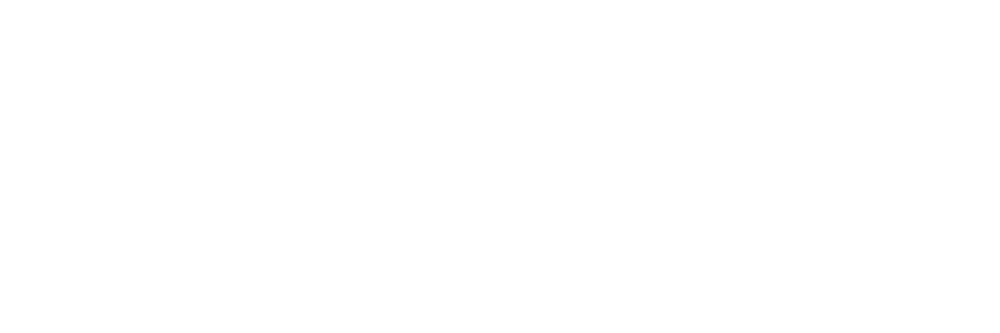

KeyError: "None of [['2913', '1367', '1520', '4135', '11', '4014', '2933', '3081', '5297', '1088', '2937', '2835', '5065', '941', '2968', '1503', '5596', '5131', '2869', '4969', '2562', '2998', '2640', '1214', '3233', '4200', '2800', '942', '1378', '5326', '2931', '2690', '6240', '5270', '6662', '3916', '1692', '2992', '1412', '2954', '328', '2911', '1073', '3029', '3261', '2986', '2611', '2871', '6389', '4151', '2705', '2650', '2561', '2441']] are in the [columns]"

In [2282]:
def inspect_split(split_of_interest):
    plt.figure(figsize=(15,5))
    clust1 = 'Level{}_{}'.format(len(split_of_interest)+1, split_of_interest+'0')
    clust2 = 'Level{}_{}'.format(len(split_of_interest)+1, split_of_interest+'1')

    #Heat map
    cells_of_interest = cluster_tree[clust1][0] + cluster_tree[clust2][0]

    z = df.values
    z = z/np.percentile(z, 80, 1)[:,None]
    z = pd.DataFrame(data=z, index=df.index, columns=df.columns)
    z = df.loc[:, cells_of_interest]

    plt.pcolor(z, cmap='viridis')#, vmax=1)

    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(cells_of_interest))
    plt.vlines(len(cluster_tree[clust1][0]), 0, 35, colors='w')
    plt.title('Looking at the split of "{}" into "{}" and "{}"'.format(split_of_interest, clust1, clust2))

    #Correlation
    print('Correlation r cluster 0 & 1: {}'.format(np.corrcoef(df.loc[:,cluster_tree[clust1][0]].T.mean(), df.loc[:,cluster_tree[clust2][0]].T.mean())[0,1]))

    #Differential expression
    df1 = df.loc[:,cluster_tree[clust1][0]]
    df2 = df.loc[:,cluster_tree[clust2][0]]
    
    pval = []
    for i in df1.index:
        try:
            test = scipy.stats.mannwhitneyu(df1.loc[i], df2.loc[i], alternative='two-sided')
        except Exception as e:
            print(e)
            
        if rule_expression(test[1], df1.loc[i].mean(), df2.loc[i].mean()):
            print('DIFFERENT: ', i.split('_')[1],' mean1=', df1.loc[i].mean(),' mean2=', df2.loc[i].mean(), ' p=', test[1])
        else:
            print(i.split('_')[1], round(df1.loc[i].mean(),3), round(df2.loc[i].mean(),3), rule_expression(test[1], df1.loc[i], df2.loc[i]) )

        
    #Difference in mean expression
    try:
        print('\nMean expression df1: {}, df2: {}\n'.format(df1.mean(axis=1).mean(), df2.mean(axis=1).mean()),
              scipy.stats.mannwhitneyu(df1.mean(axis=1), df2.mean(axis=1), alternative='two-sided'))
    except Exception as e:
        print(e)
        
inspect_split('0001010')

In [1718]:
gene = 'Hybridization7_Ctps'
print(df1.loc[gene].mean(), df2.loc[gene].mean())

-0.599178924158 0.0500060374035


In [2069]:
#Find the 

#Make a dictionary with for every last cluster a list of all the preceding clusters
branches = {}
for lc in last_clusters[:]:
    branches[lc] = []
    code_short = lc.split('_')[1]
    for n in range(len(code_short)):
        code_long = 'Level{}_{}'.format(n, code_short[:n])
        branches[lc].append(code_long)

def rule_expression(p, gene_df1, gene_df2):
    #log_size
    p_cutoff = 0.0000000000000001
    #exp_high = 0.3
    #exp_low = 0.25
    #mean_diff = 0.2
    mean_diff = 750 #totmol dataset
    
    #totmol alternative rule based on 
    
    if p == None:
        return
    #if p < p_cutoff and ((gene_df1.mean()>exp_high and gene_df2.mean()<exp_low) or (gene_df2.mean()>exp_high and gene_df1.mean()<exp_low)):
    if p < p_cutoff and (abs(gene_df1.mean() - gene_df2.mean()) > mean_diff):
        return True
   
    
#Final clusters based on differential expression
final_clusters_diffex = set([])
#Final clusters based on differential expression and expression level
final_clusters_diffex_level = set([])
#Differentially expressed genes per level
diffex_genes = {}

#Add differentially expressed genes to the 
for level_of_interest in last_clusters:
    for i, l in enumerate(branches[level_of_interest]):
        code_short = l.split('_')[1]
        next_code_0 = 'Level{}_{}'.format(len(code_short)+1, code_short+'0')
        next_code_1 = 'Level{}_{}'.format(len(code_short)+1, code_short+'1')
        df1 = df.loc[:,cluster_tree[next_code_0][0]]
        df2 = df.loc[:,cluster_tree[next_code_1][0]]

        genes = [df.index[n] for n, p in enumerate(cluster_tree[l][3]) if rule_expression(p[1], df1.loc[df.index[n]], df2.loc[df.index[n]])]
        #Add the differentially expressed genes to the level
        diffex_genes[l] = genes

#Make dictionary with differentially expressed genes for all preceding levels
branche_difex = {}
for level_of_interest in last_clusters:
    branche_difex[level_of_interest] = [diffex_genes[l] for l in branches[level_of_interest]]  

#Check if it is the last split based on the differential expression
for level_of_interest in last_clusters:
    for n, genes in enumerate(branche_difex[level_of_interest]):

        if n == len(branche_difex[level_of_interest])-1:
            print('NO END CLUSTER for brance: {}'.format(level_of_interest))
            break
            
        if n == 0: # or n == 1 or n == 2:
            pass
        #Check if next level has the same genes or if it has no differentially expressed genes in the current and next 
        elif genes == branche_difex[level_of_interest][n+1] or (genes == [] and branche_difex[level_of_interest][n+1] == []) :
        #Check if next level has the same genes or if it has no differentially expressed genes
        #elif genes == branche_difex[level_of_interest][n+1] or genes == []:
            final_clusters_diffex.add(branches[level_of_interest][n])
            break
        
#Check if it is the last level based on the differential expression and expression level
    #for..... last_levels
    #for n, genes in enumerate(branche_difex[level_of_interest]):
    #    if n == 0:
    #        pass
    #    #Check if previous level has the same genes and  if it has no differentially expressed genes
    #    if (any(genes) in branche_difex[level_of_interest][n-1]) and branche_difex[level_of_interest][n-1] == []:
    #        final_clusters_diffex_level.add(branches[level_of_interest][n])
    #        break    
    #print(final_clusters_diffex_level)

NO END CLUSTER for brance: Level10_0001000110
NO END CLUSTER for brance: Level10_0001000101


In [2070]:
print(len(final_clusters_diffex))
final_clusters_diffex

12


{'Level2_00',
 'Level2_01',
 'Level2_10',
 'Level2_11',
 'Level3_000',
 'Level4_0001',
 'Level5_00010',
 'Level6_000100',
 'Level9_000100000',
 'Level9_000100001',
 'Level9_000100010',
 'Level9_000100011'}

<IPython.core.display.Javascript object>


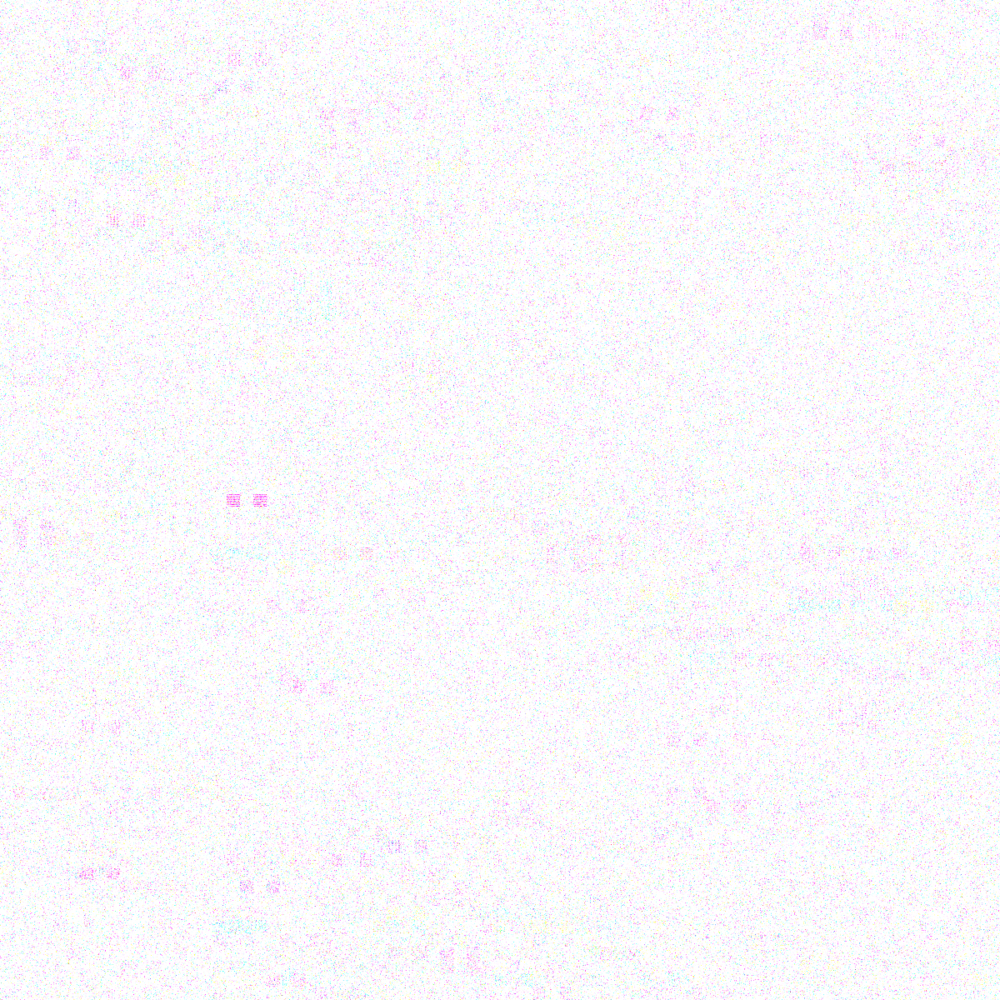

In [2071]:
#Plot the cluster tree
plt.figure(figsize=(15,15))
for l in last_clusters[:]:
    code = l.split('_')[1]
    code = [int(x) for x in list(code)]
    x = range(len(code)+1)
    
    y=[0]
    for i in range(len(code)):
        c = code[:i+1]
        steps = []
        for n, i in enumerate(c):
            max_l = 2 ** ((depth) - n)
            s = (1/4) * max_l
            if i == 0:
                steps.append(-s)
            elif i == 1:
                steps.append(s)
        y.append(sum(steps))
        
    plt.plot(x,y, c=[0.9, 0.9, 0.9])
    
for l in final_clusters_diffex:
    code = l.split('_')[1]
    code = [int(x) for x in list(code)]
    x = range(len(code)+1)
    
    y=[0]
    for i in range(len(code)):
        c = code[:i+1]
        steps = []
        for n, i in enumerate(c):
            max_l = 2 ** ((depth) - n)
            s = (1/4) * max_l
            if i == 0:
                steps.append(-s)
            elif i == 1:
                steps.append(s)
        y.append(sum(steps))
        
    plt.plot(x,y, marker='o')
    
    plt.text(x[-1], y[-1], l.split('_')[1], fontsize=10)

In [1911]:
final_clusters_diffex

{'Level3_111',
 'Level4_0000',
 'Level4_0110',
 'Level4_1011',
 'Level5_00011',
 'Level5_00100',
 'Level5_00101',
 'Level5_00110',
 'Level5_00111',
 'Level5_01001',
 'Level5_01010',
 'Level5_01011',
 'Level5_01110',
 'Level5_01111',
 'Level5_10000',
 'Level5_10010',
 'Level5_10011',
 'Level5_11010',
 'Level5_11011',
 'Level6_000000',
 'Level6_000001',
 'Level6_000101',
 'Level6_001001',
 'Level6_010000',
 'Level6_010001',
 'Level6_100010',
 'Level6_100011',
 'Level6_101001',
 'Level6_101010',
 'Level6_101011',
 'Level6_110000',
 'Level6_110001',
 'Level6_110010',
 'Level6_110011',
 'Level7_0001000',
 'Level7_0001001',
 'Level7_0011000',
 'Level7_0011001',
 'Level7_1010000',
 'Level7_1010001',
 'Level8_00000000',
 'Level8_00000001',
 'Level9_000100000',
 'Level9_000100001'}

In [1915]:
dat = df.loc[:,cluster_tree['Level7_0011001'][0]]

In [1934]:
mean_exp = df.mean(axis=1)

<IPython.core.display.Javascript object>


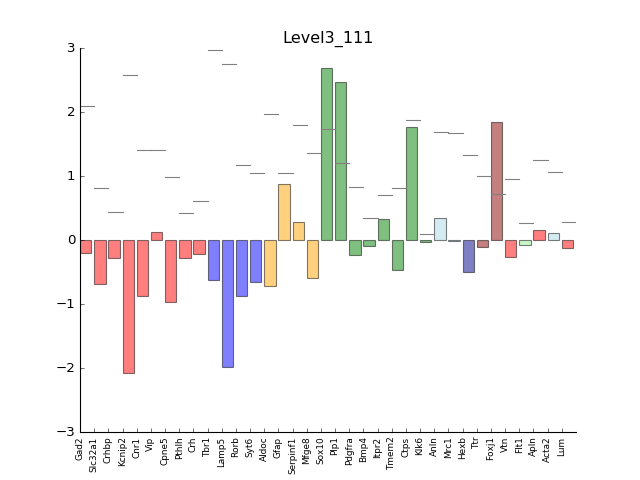

<IPython.core.display.Javascript object>


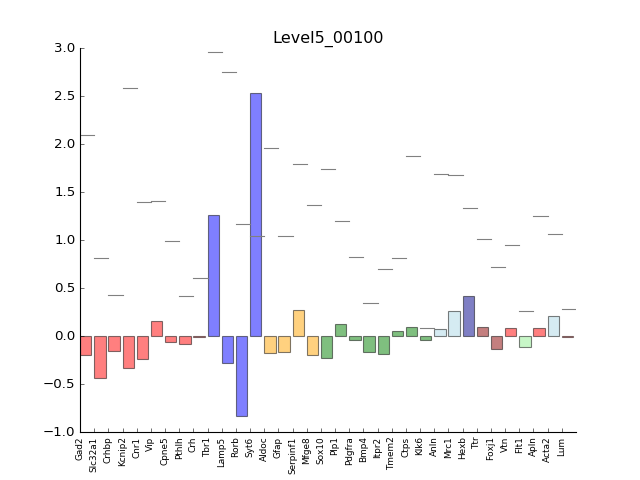

<IPython.core.display.Javascript object>


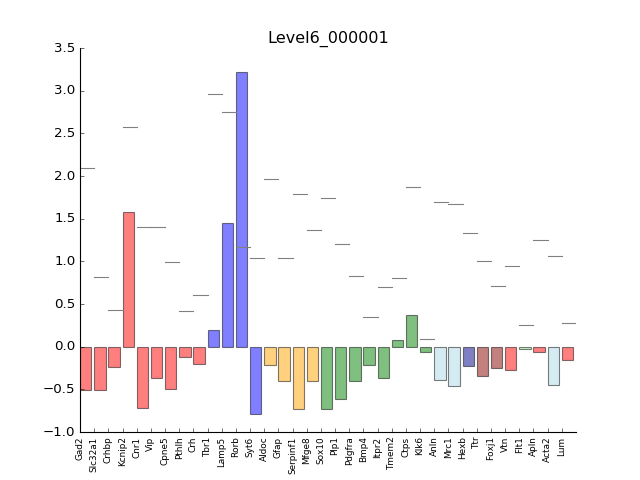

<IPython.core.display.Javascript object>


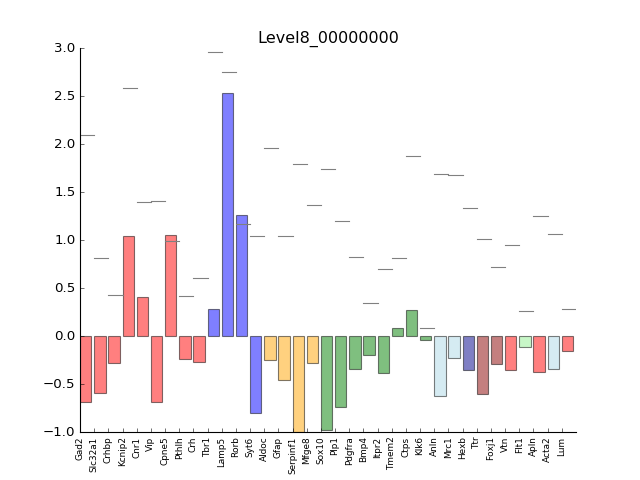

<IPython.core.display.Javascript object>


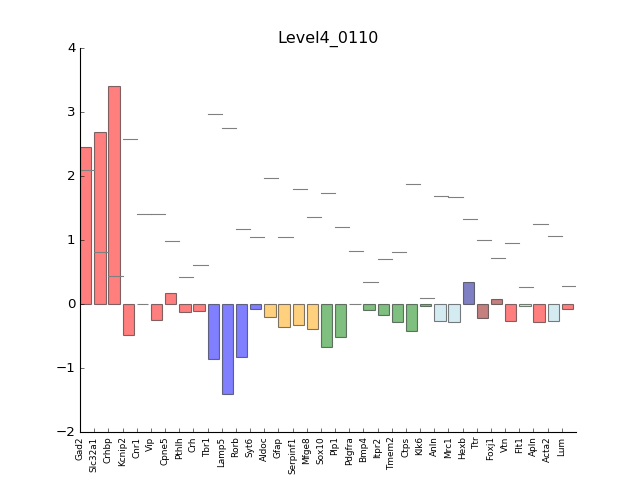

<IPython.core.display.Javascript object>


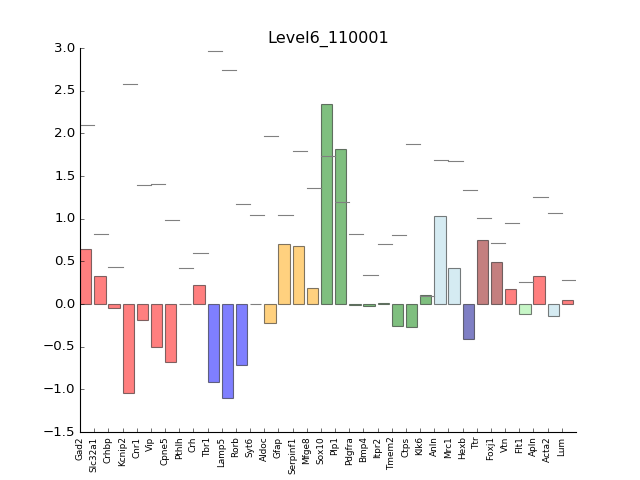

<IPython.core.display.Javascript object>


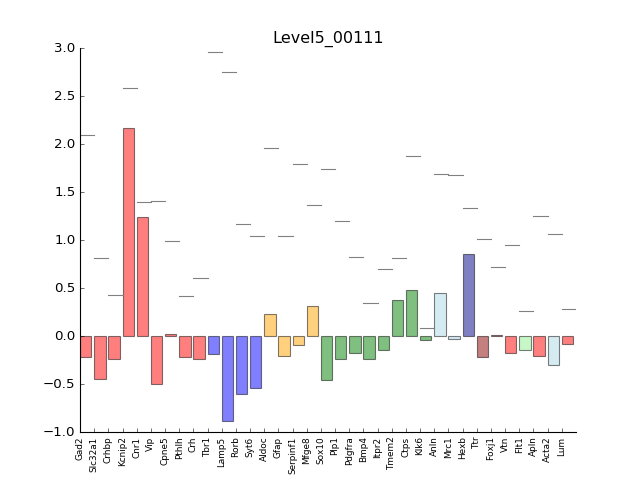

<IPython.core.display.Javascript object>


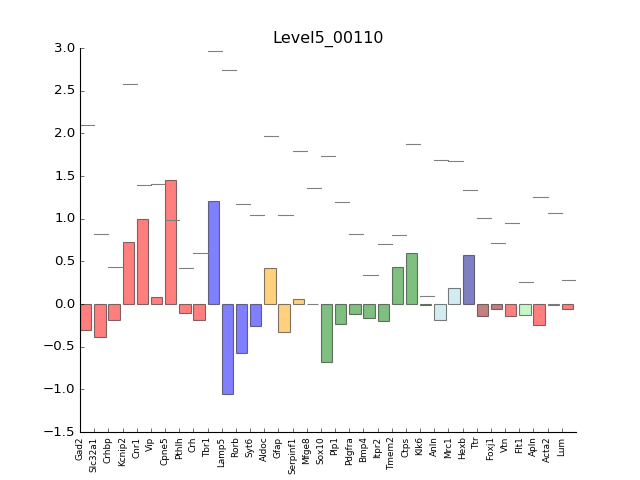

<IPython.core.display.Javascript object>


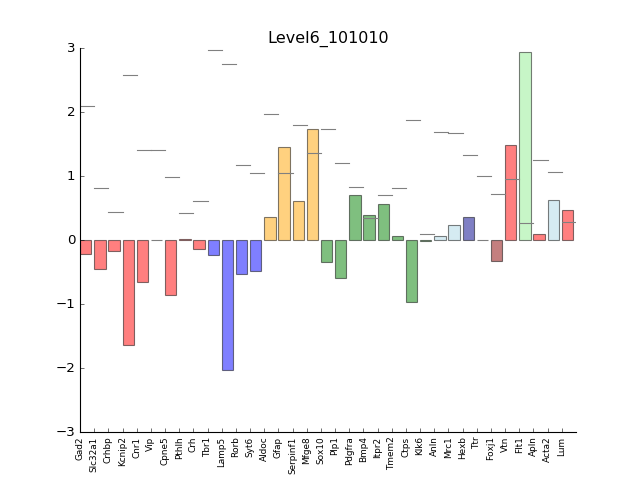

<IPython.core.display.Javascript object>


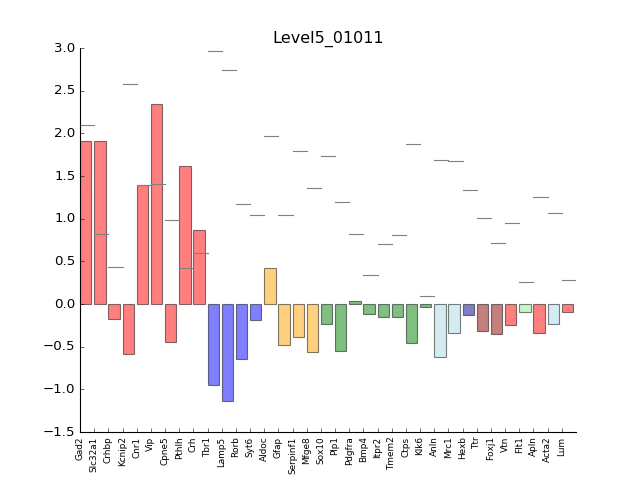

<IPython.core.display.Javascript object>


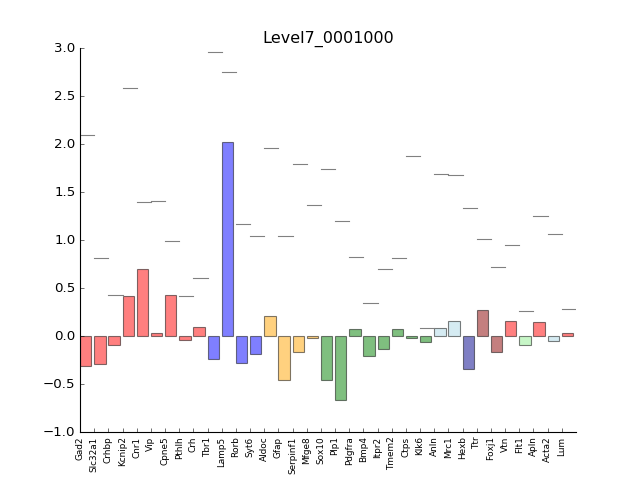

<IPython.core.display.Javascript object>


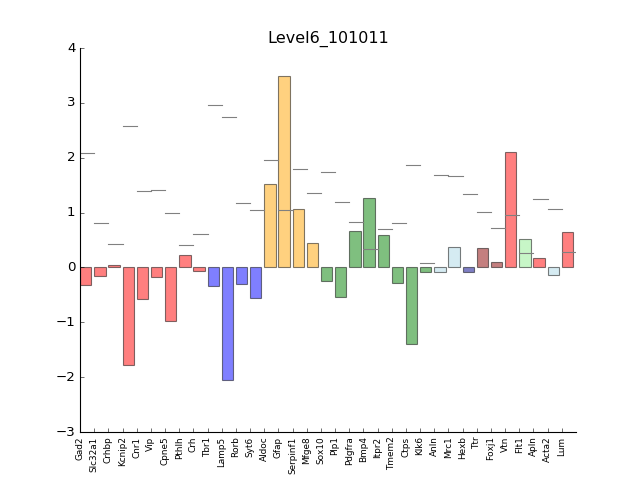

<IPython.core.display.Javascript object>


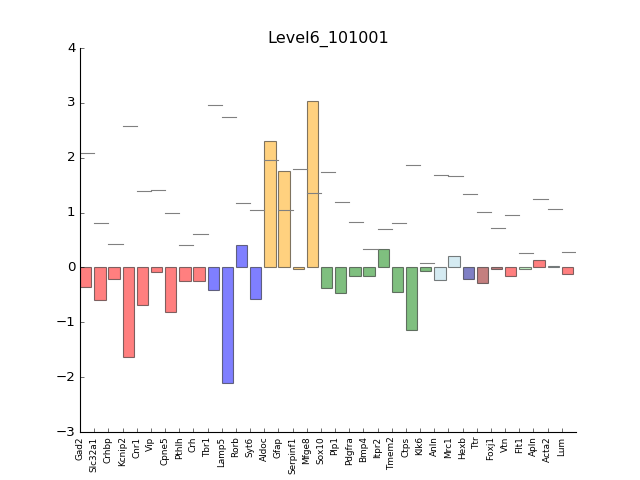

<IPython.core.display.Javascript object>


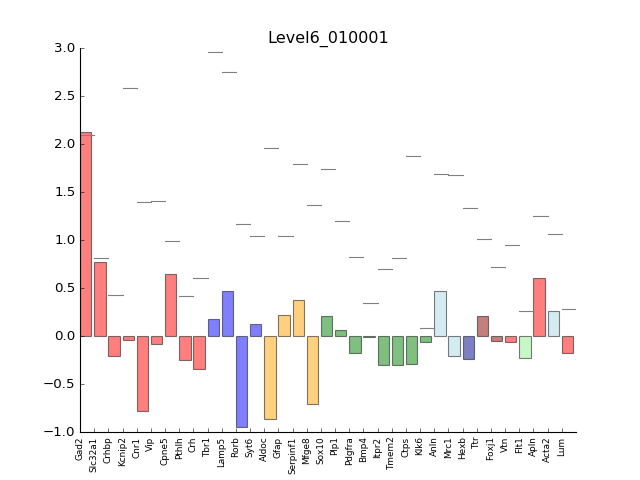

<IPython.core.display.Javascript object>


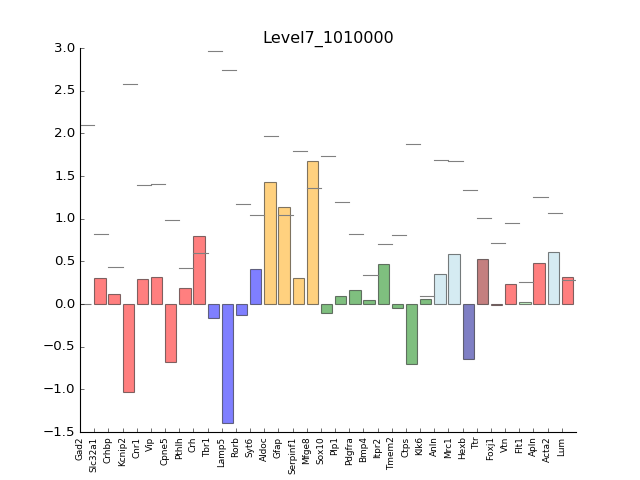

<IPython.core.display.Javascript object>


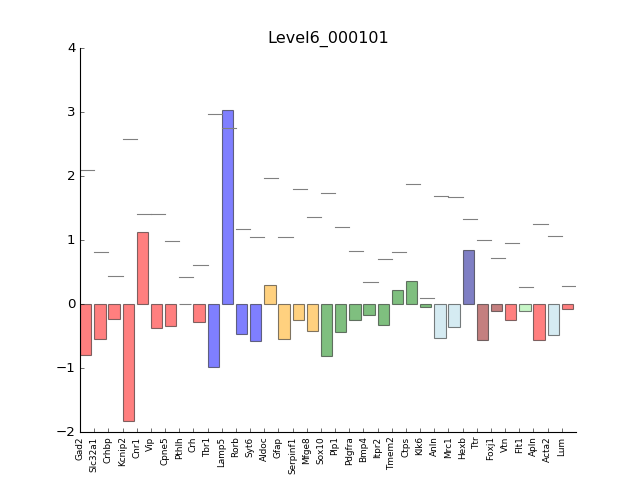

<IPython.core.display.Javascript object>


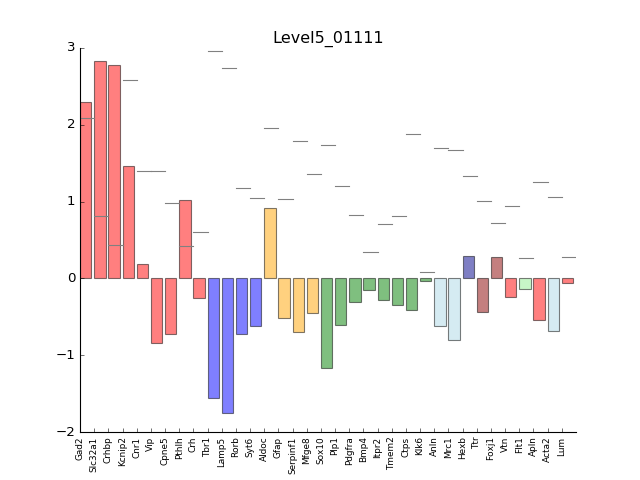

/home/lars/programs/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


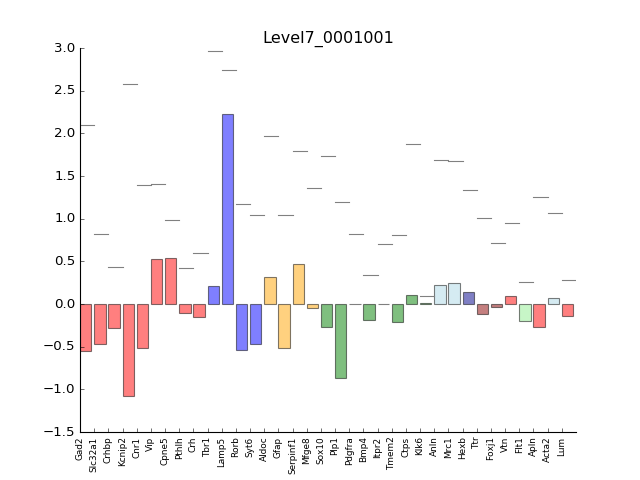

<IPython.core.display.Javascript object>


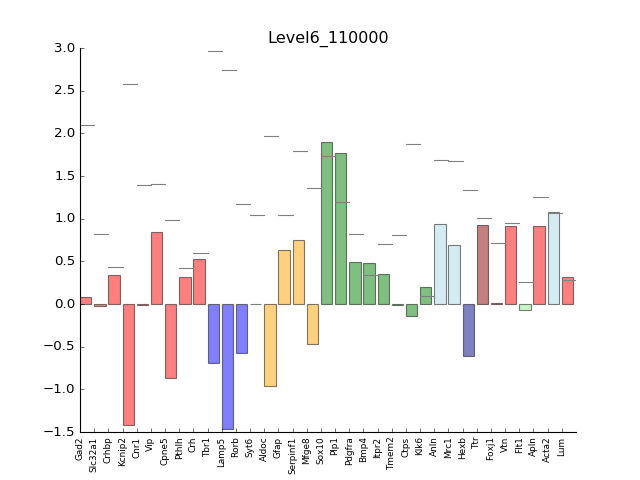

<IPython.core.display.Javascript object>


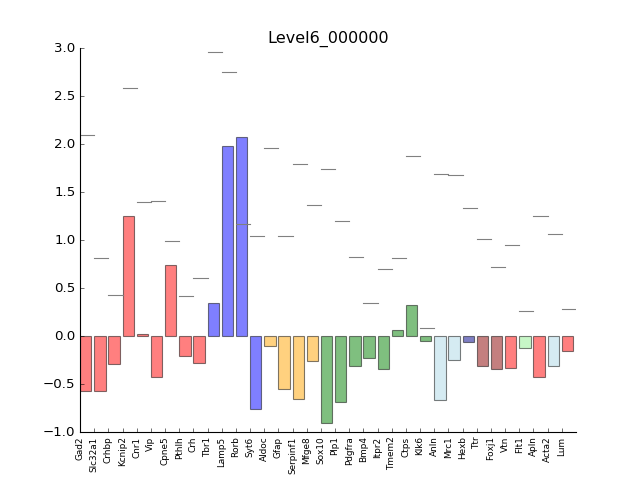

<IPython.core.display.Javascript object>


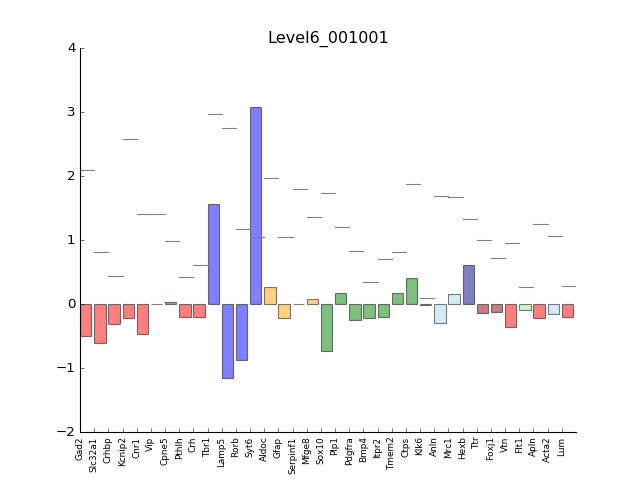

<IPython.core.display.Javascript object>


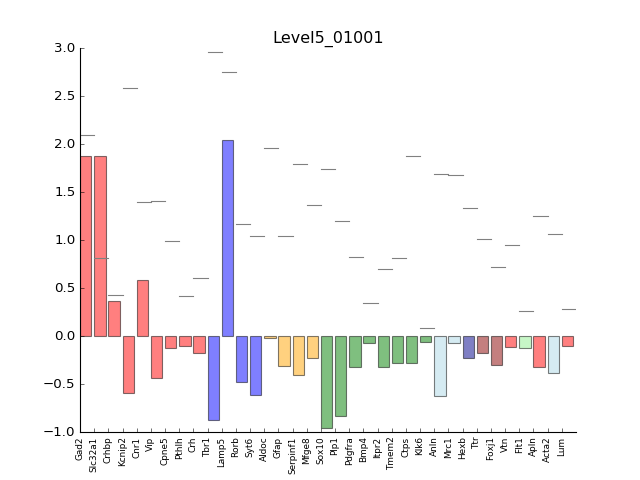

<IPython.core.display.Javascript object>


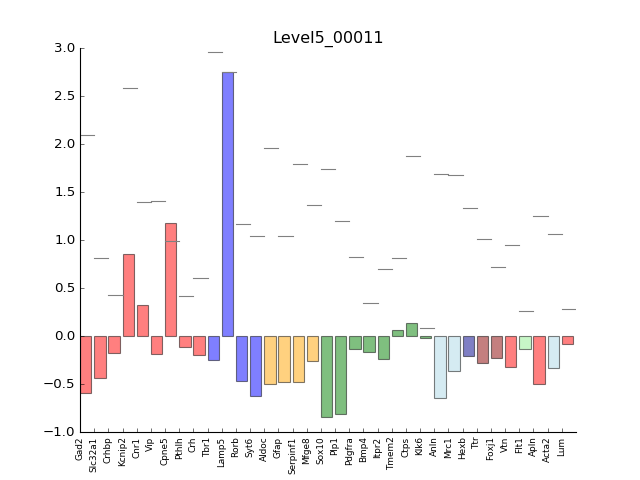

<IPython.core.display.Javascript object>


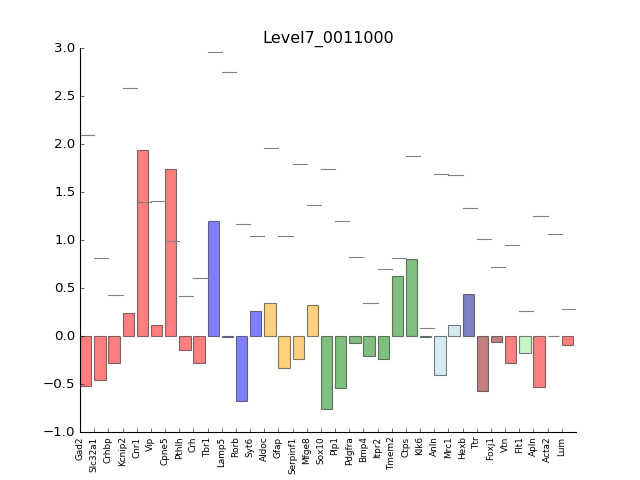

<IPython.core.display.Javascript object>


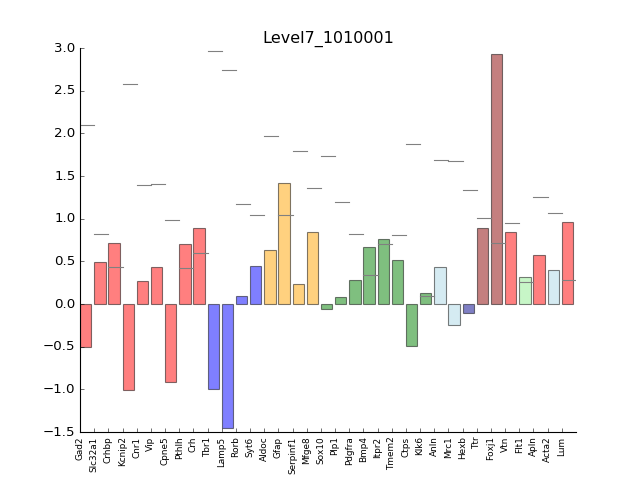

<IPython.core.display.Javascript object>


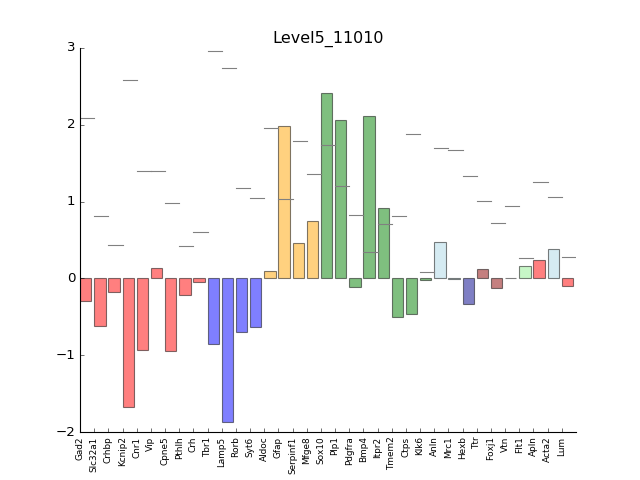

<IPython.core.display.Javascript object>


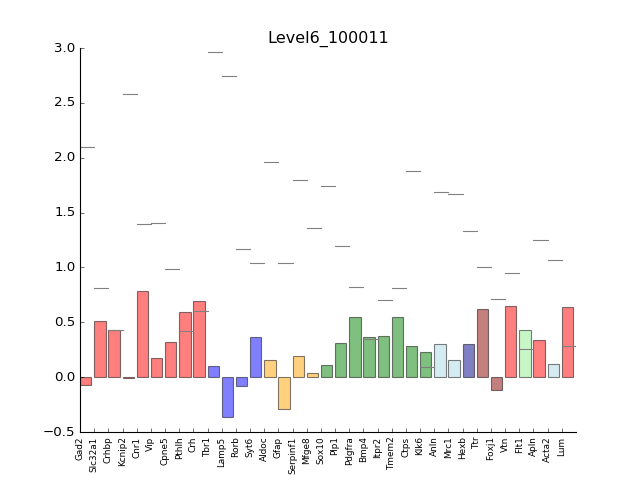

<IPython.core.display.Javascript object>


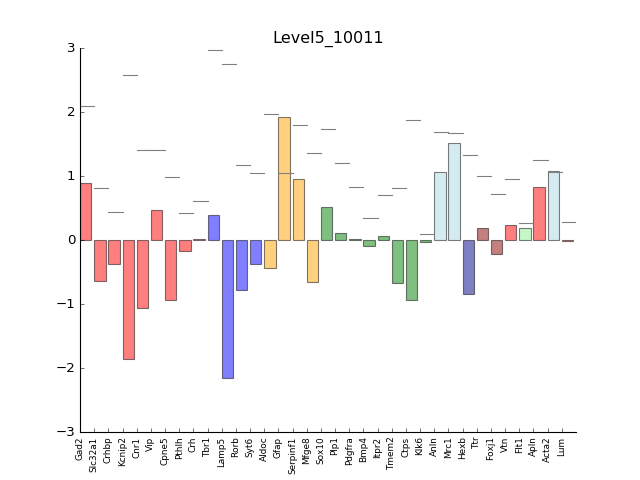

<IPython.core.display.Javascript object>


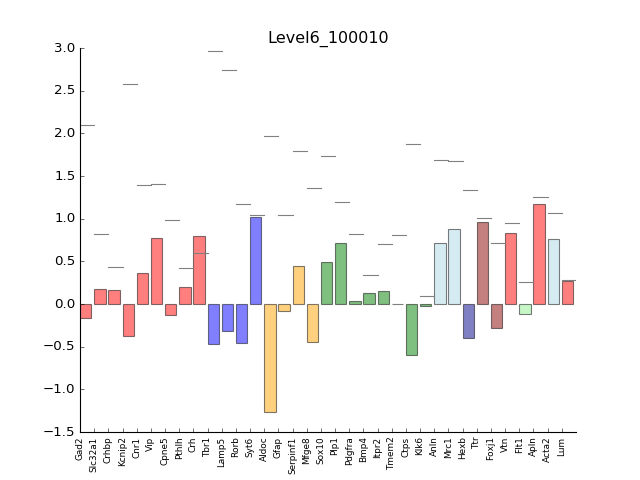

<IPython.core.display.Javascript object>


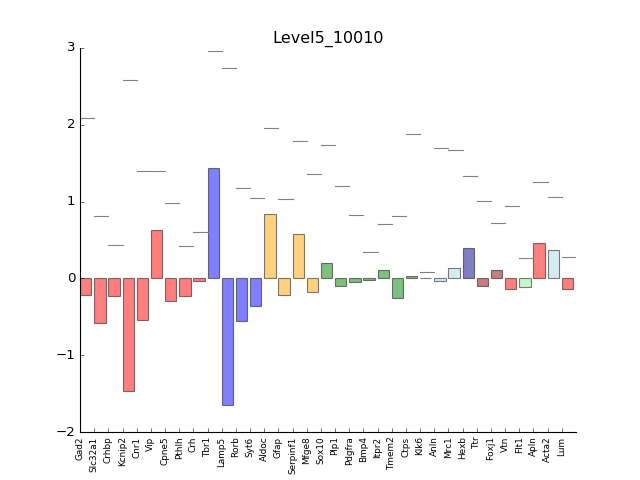

<IPython.core.display.Javascript object>


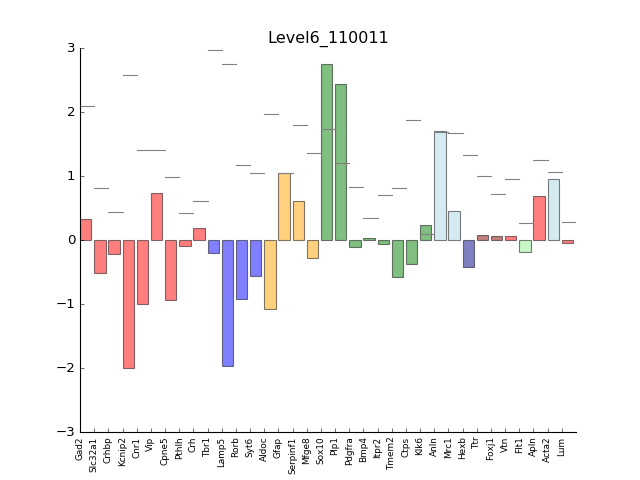

<IPython.core.display.Javascript object>


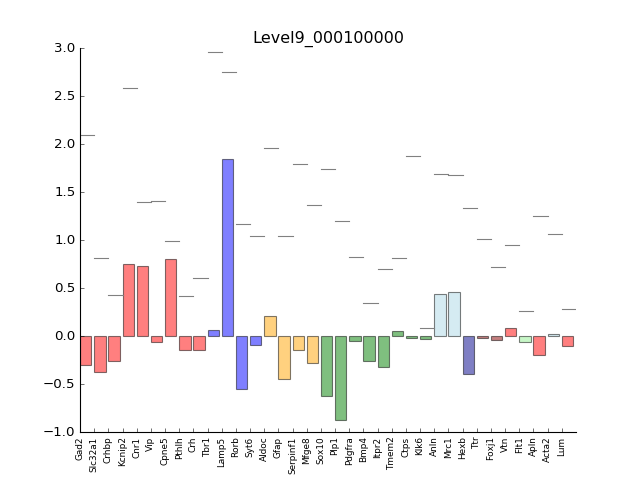

<IPython.core.display.Javascript object>


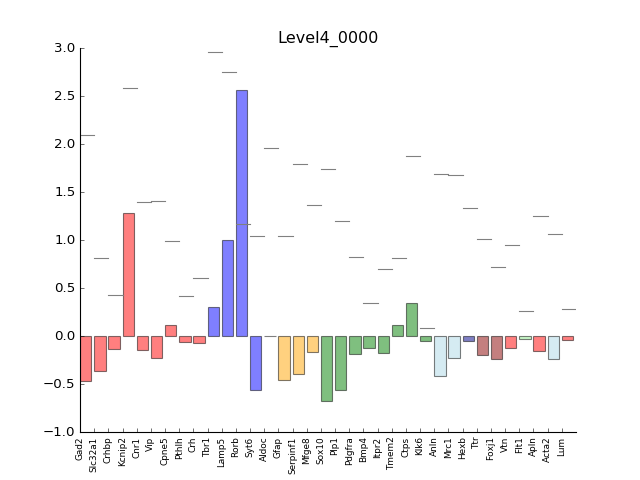

<IPython.core.display.Javascript object>


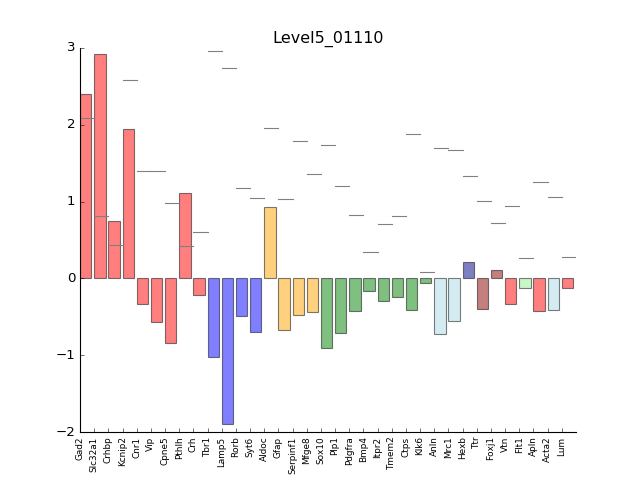

<IPython.core.display.Javascript object>


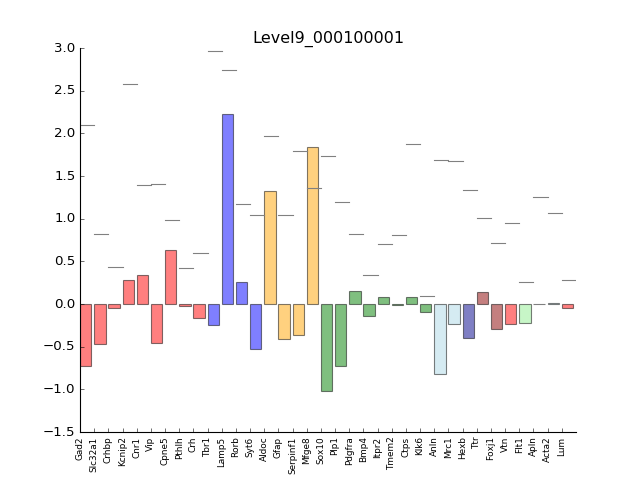

<IPython.core.display.Javascript object>


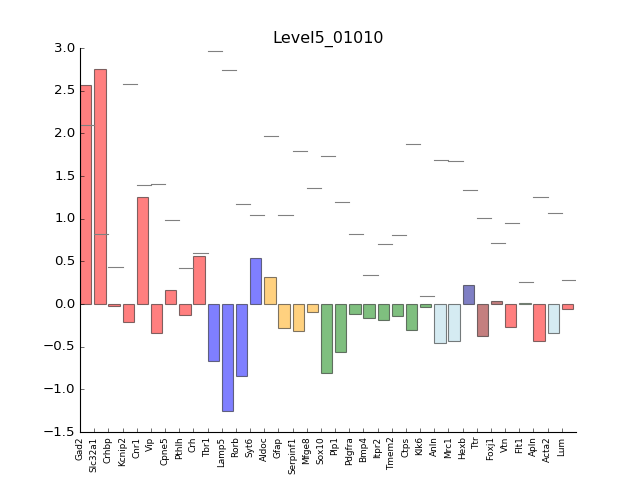

<IPython.core.display.Javascript object>


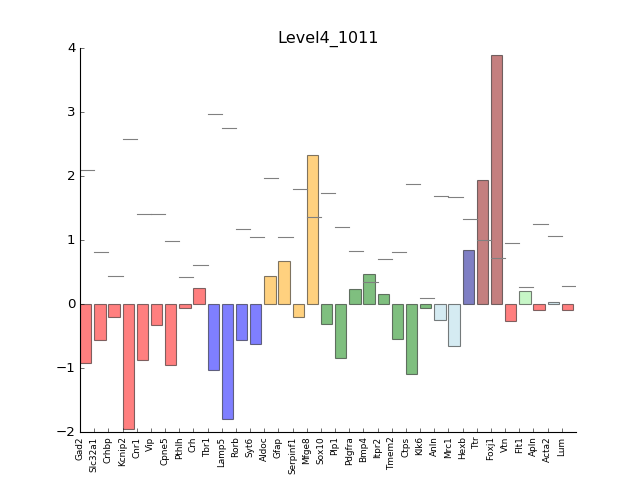

<IPython.core.display.Javascript object>


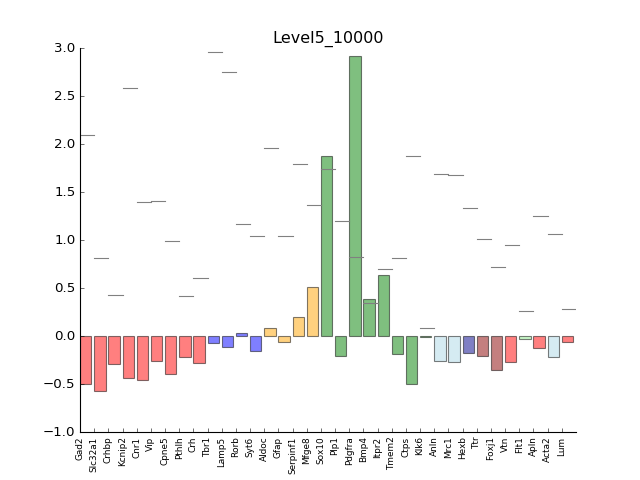

<IPython.core.display.Javascript object>


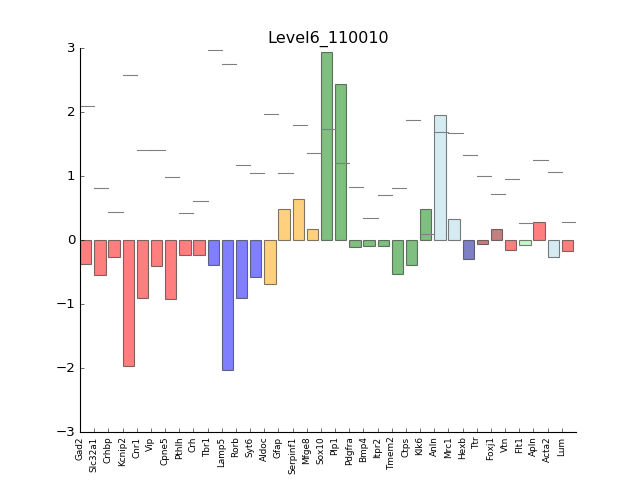

<IPython.core.display.Javascript object>


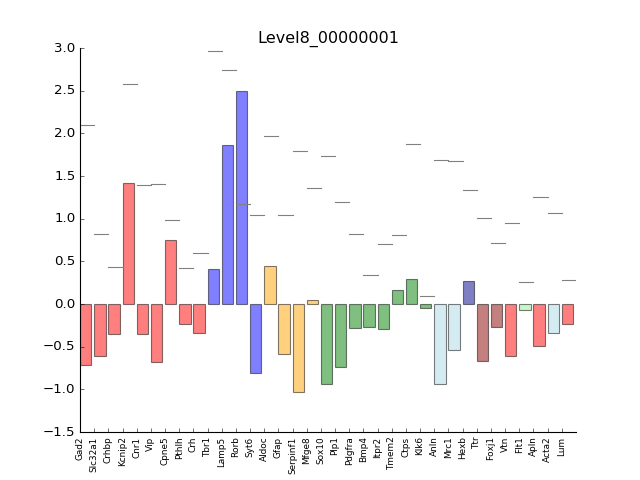

<IPython.core.display.Javascript object>


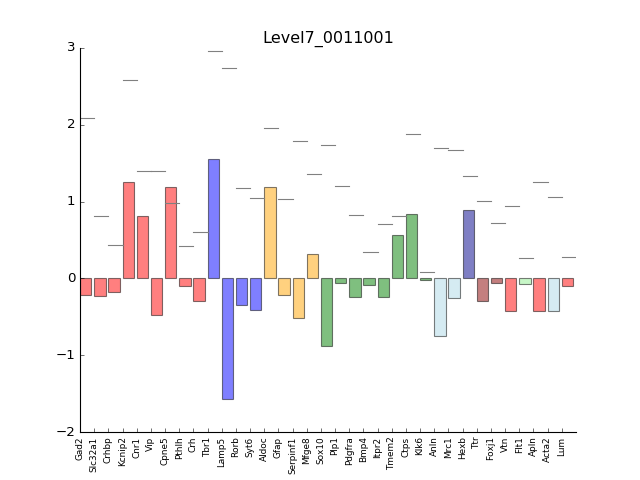

<IPython.core.display.Javascript object>


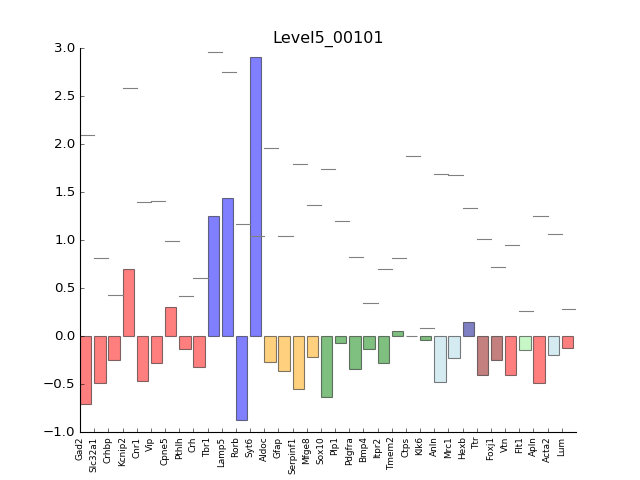

<IPython.core.display.Javascript object>


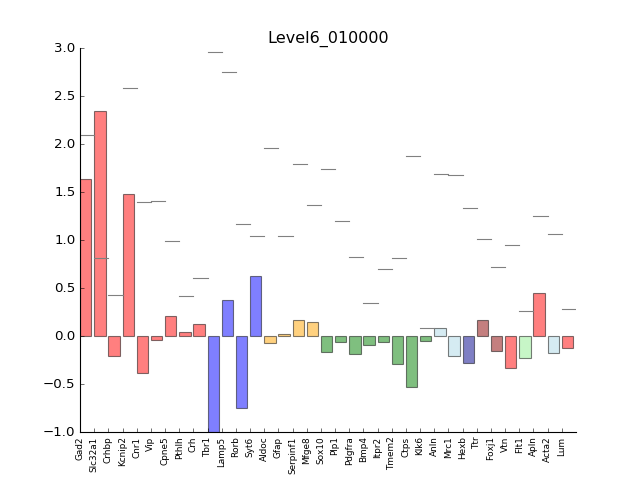

<IPython.core.display.Javascript object>


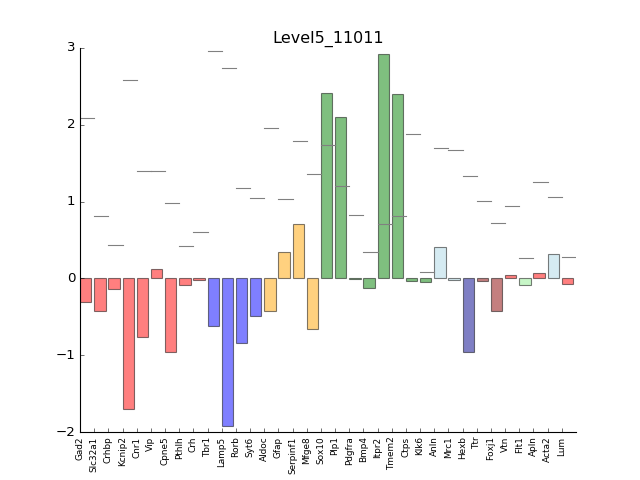

In [1948]:
for i in final_clusters_diffex:
    data = df.loc[:,cluster_tree[i][0]]
    fig, ax = plt.subplots()
    gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
        'green', 'green', 'green', 'green', 'green',  'green', 'green', 'green',
        'lightblue', 'lightblue', 'darkblue', 'darkred','darkred','red','lightgreen','red','lightblue']
    left_pos = range(dat.shape[0])

    ax.bar(left_pos, data.mean(axis=1) - mean_exp, color=gene_colors, alpha=0.5)
    labels = [i.split('_')[1] for i in list(df.index)]
    ax.set_xticks(left_pos)
    ax.set_xticklabels(labels, rotation='vertical', fontsize=8)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_title(i)
    ax.set_ylabel('Difference from mean')
"""    
    for i, m in enumerate(mean_exp):
        ax.axhline(m, xmin=i/len(mean_exp), xmax=(i+1)/len(mean_exp), color='grey')"""


In [1282]:
cluster_tree['Level6_011011'][3]

[MannwhitneyuResult(statistic=1834.5, pvalue=0.6479829031799309),
 MannwhitneyuResult(statistic=1754.5, pvalue=0.93440293218426995),
 MannwhitneyuResult(statistic=1896.0, pvalue=0.29223050297037012),
 MannwhitneyuResult(statistic=975.0, pvalue=0.00021325974138366885),
 MannwhitneyuResult(statistic=1002.5, pvalue=0.00035304893953125592),
 MannwhitneyuResult(statistic=2328.0, pvalue=0.0043102888390582081),
 MannwhitneyuResult(statistic=1800.5, pvalue=0.77129355729695492),
 MannwhitneyuResult(statistic=1733.0, pvalue=0.95799389029902271),
 MannwhitneyuResult(statistic=1501.5, pvalue=0.17821718939055753),
 MannwhitneyuResult(statistic=1999.0, pvalue=0.21055994994771965),
 MannwhitneyuResult(statistic=1387.0, pvalue=0.087767537849879979),
 MannwhitneyuResult(statistic=1197.0, pvalue=0.0058161101534965533),
 MannwhitneyuResult(statistic=1125.0, pvalue=0.00022014771375386731),
 MannwhitneyuResult(statistic=1193.0, pvalue=0.0073325617739829624),
 MannwhitneyuResult(statistic=1882.5, pvalue=0.4

In [1263]:
#Logarithmic tree
#plt.figure(figsize=(15,15))
for l in last_clusters[:]:
    code = l.split('_')[1]
    code = [int(x) for x in list(code)]
    x = range(len(code)+1)
    y = [0]
    
    for i in range(len(code)):
        c = code[:i+1]
        coord = sum([(p * (2**(len(c)-(n+1)))) for n, p in enumerate(c)]) - (0.5* (2**(i+1)))
        y.append(coord)
        
    plt.plot(x,y, marker='o')
    plt.text(x[-1], y[-1], l.split('_')[1], fontsize=10)

In [1264]:
#Wrong tree
#plt.figure(figsize=(15,10))
for l in last_clusters:
    y = range(int(l.split('_')[0].split('Level')[1])) #number of splits
    code = l.split('_')[1]
    x = []
    for i in range(len(code)):
        x.append(sum([int(s)+range(len(code))[len(code)-1] for s in list(code)][:i]))
    plt.plot(x, y)
#plt.axis('equal')


<IPython.core.display.Javascript object>


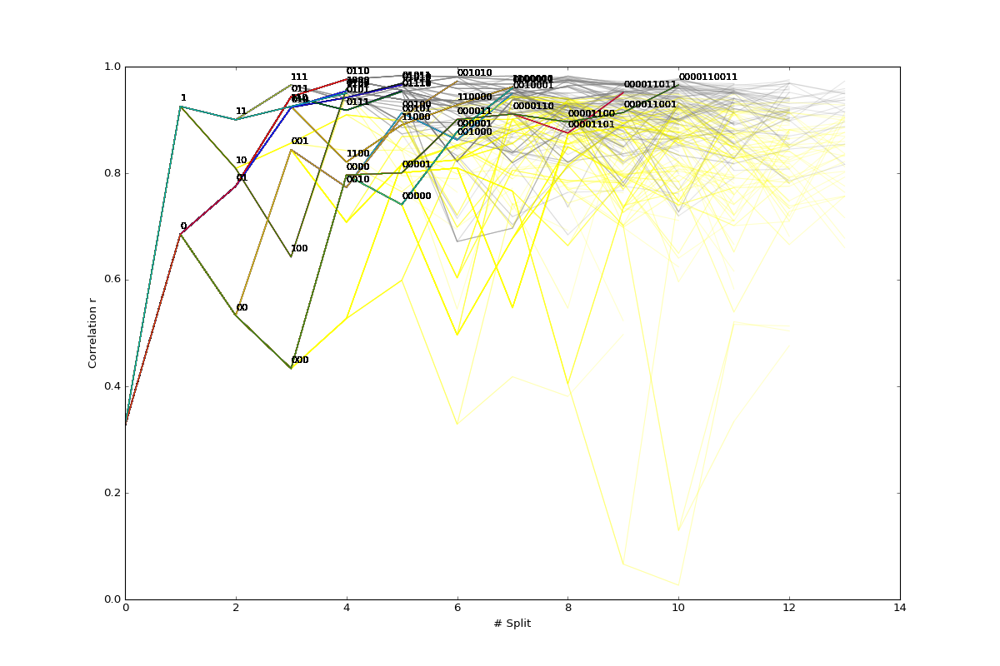

15 {'Level3_111', 'Level4_0100', 'Level5_01111', 'Level10_0000110011', 'Level5_01110', 'Level5_01011', 'Level5_01010', 'Level4_0110', 'Level9_000011011', 'Level7_0010001', 'Level4_1101', 'Level6_001010', 'Level7_0000011', 'Level7_1100000', 'Level4_1000'}


In [954]:
#Cluster evaluation based on Correlation
#Plot the correlation 

corr_clust = {}
for l in last_clusters:
    corr_clust[l] = []
    code_s = l.split('_')[1]
    for n in range(len(code_s)):
        code_l = 'Level{}_{}'.format(n, code_s[:n])
        corr_clust[l].append(cluster_tree[code_l][2])

def rule_corr(corr_list):
    for i, r in enumerate(corr_list[:-1]):
        if i == 0 or i == 1:
            pass
        else:
            #if corr_list[i-1] < r and r > .9 and corr_list[i+1] > r:
            if r > .95:
                return i  
            
final_clust = set([])
        
plt.figure(figsize=(15,10))
for i in corr_clust.keys():
    r = corr_clust[i]
    
    stop = rule_corr(r)
    if stop != None:
        terminal_cluster = 'Level{}_{}'.format(stop, i.split('_')[1][:stop])
        final_clust.add(terminal_cluster)
        plt.plot(r[:stop+1])
        for n, m in enumerate(r[:stop+1]):
            text = i.split('_')[1][:n]
            plt.text(n, m+0.01, text, fontsize=10)
        plt.plot(range(stop-1, len(r)), r[stop-1:], alpha=0.1, c='grey')
    else:
        plt.plot(r, c='yellow', alpha=0.1, linewidth=1)

plt.ylabel('Correlation r')
plt.xlabel('# Split')
        
print(len(final_clust) ,final_clust)
    

In [ ]:
def iterative_clustering(df):
    #Make the label table
    initial_labels = np.array(['L0_C0' for i in range(len(df_fish.columns))]).reshape((1,len(df_fish.columns)))
    label_tree = pd.DataFrame(data=initial_labels, columns=df.columns)
    
    current_level = 0
    offset = 0
    
    #Iterate through the current sub clusters
    for superclust in np.unique(label_tree.loc[current_level]):
        current_level += 1
        print(superclust)
        filt = label_tree.loc[current_level] == superclust
        df_to_clust = df.loc[:,filt]
        
        #Split cells into two clusters
        split = AgglomerativeClustering(n_clusters=2).fit(df_to_clust.T)
        
        #Update the label_tree with new temporary labels (Format: Level X _ Cluster Y --> LxCy)
        for i, cell in enumerate(df_to_clust.columns):
            cluster_id = 'L{}_C{}'.format((current_level), (split.labels_[i]+offset))
            label_tree.loc[current_level, cell] = cluster_id

# TOTMOL dataset clustering

In [2597]:
#INPUT:
df = df_fish_totmol#.iloc[:,:3000]
expression_threshold = 550
alpha = 0.1e-20
allow_level_difference=False
min_clust_size = 10
dataset_fraction = 0.1

####################################

def cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction, allow_level_difference=False):
    """
    Check if the clusters pass the criteria
    
    """
    evaluation = [0,0]
    
    #Investigate if there are genes enriched in a cluster
    enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
    enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()
    
    if df1.shape[1] > (dataset_fraction * df.shape[1]) or df2.shape[1] > (dataset_fraction * df.shape[1]):
        evaluation[0] = 3
    
    elif enriched_df1 == [] and enriched_df2 == []: #No enriched genes in both groups
        evaluation[0] = 0
    elif enriched_df1 == enriched_df2: #Same enriched genes for both groups, level difference
        if allow_level_difference == True:
            evaluation[0] = 1
        else:
            evaluation[0] = 0
    elif enriched_df1 != enriched_df2: #At least one gene differential enriched
        evaluation[0] = 2
        
    
    
    #Test if there is a significant difference in the enriched genes between the groups
    diff_expressed = {'df1':[],
                      'df2':[],
                      'both':[]}
    for gene in [i for i in enriched_df1 if i in enriched_df2]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['both'].append([gene, test_p])
            evaluation[1] = 1
    for gene in [i for i in enriched_df1 if i not in enriched_df2]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['df1'].append([gene, test_p])
            evaluation[1] = 2
    for gene in [i for i in enriched_df2 if i not in enriched_df1]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['df2'].append([gene, test_p])
            evaluation[1] = 2
    return evaluation

def re_cluster(dfs = [df1, df2]):
    """
    Evaluate a list of clusters (dataframes) by splitting them again and 
    evaluating the daughter clusters.
    Input:
    `dfs`(list): List of Pandas dataframes containing one cluster.
    
    """
    re_evaluation = []
    for d in dfs:
        split = AgglomerativeClustering(n_clusters=2).fit(d.T)
        split_labels = split.labels_ 
        df_daughter_1 = d.loc[:,split_labels == np.unique(split_labels)[0]]
        df_daughter_2 = d.loc[:,split_labels == np.unique(split_labels)[1]]
        re_evaluation.append(cluster_evaluation(df_daughter_1, df_daughter_2, expression_threshold, 
                                                alpha, dataset_fraction,
                                                allow_level_difference=allow_level_difference))
    return(re_evaluation)  
    


finished_clusters = []
label_ofset = 0

#Make matrix for labels. First row all zeros
label_matrix = pd.DataFrame(data= np.zeros((1, df.shape[1])), index = ['Level_0'], columns=df.columns, dtype='Int64')

for cycle, x in enumerate(range(35)):
    
    previous_level = 'Level_{}'.format(cycle)
    current_level = 'Level_{}'.format(cycle + 1)
    
    if list(set(label_matrix.loc[previous_level]) - set(finished_clusters)) == []:
        print('DONE DONE DONE')
        break
    
    #Add row and copy labels
    label_matrix.loc[current_level] = label_matrix.loc[previous_level]

    #Loop through all labels that are not in finished_clusters
    for old_label in [i for i in np.unique(label_matrix.loc[current_level]) if i not in finished_clusters]:
        label_ofset += 2
        print(current_level, 'label: ', old_label)

        #Create dataframe to split
        filt = label_matrix.loc[current_level] == old_label
        df_to_split = df.loc[:,filt]

        #Cluster dataframe into two clusters
        split = AgglomerativeClustering(n_clusters=2).fit(df_to_split.T)
        split_labels = split.labels_ + label_ofset #Labels are 0 and 1, shift them with the clustering step
        unique_split_labels = np.unique(split_labels)
        
        #Check if all the clusters are larger than the min_clust_size
        if all(i > min_clust_size for i in list(Counter(split_labels).values())):
            
            #Make df1 & df2
            df1 = df_to_split.loc[:,split_labels == unique_split_labels[0]]
            df2 = df_to_split.loc[:,split_labels == unique_split_labels[1]]

            #Evaluate split
            evaluation = cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction)
            
            print('LABELS: {} EVALUATION: {}'.format(unique_split_labels, evaluation))
            #List of the labels that are valid clusters (or will be in the next cycle)
            valid_labels = []

            #_____________________________________________________________________
            if evaluation[0] == 3:
                threshold = dataset_fraction * df.shape[1]
                if df1.shape[1] > threshold and df2.shape[1] > threshold:
                    valid_labels.extend(unique_split_labels)
                elif df1.shape[1] > threshold:
                    valid_labels.append(unique_split_labels[0])
                    re_evaluation = re_cluster([df2])
                    if re_evaluation[0][1] == 0:
                        finished_clusters.append(unique_split_labels[1])
                        valid_labels.append(unique_split_labels[1])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[1])
                elif df2.shape[1] > threshold:
                    valid_labels.extend(unique_split_labels[1])
                    re_evaluation = re_cluster([df1])
                    if re_evaluation[0][1] == 0:
                        finished_clusters.append(unique_split_labels[0])
                        valid_labels.append(unique_split_labels[0])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[0])
           
            
            #No enriched genes, NO expression difference
            elif evaluation[0] == 0 and evaluation[1] == 0:
                re_evaluation = re_cluster([df1, df2])
                #No valid daughter clusters in the next cycle
                if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0:
                    finished_clusters.append(old_label)
                    print('Encountered a cluster without expression: {}{}'.format(current_level, old_label))
                #Valid daughter clusters in the next cycle
                else:
                    valid_labels.extend(unique_split_labels)

            #Different genes enriched, expression difference
            elif evaluation[0] == 2 and evaluation[1] == 2:
                
                re_evaluation = re_cluster([df1, df2])
                print('re_evaluation {}'.format(re_evaluation))
                #First cluster
                if re_evaluation[0][1] == 0: #no difference in daughter clusters, current cluster finished
                    print('no future 1')
                    finished_clusters.append(unique_split_labels[0])
                    valid_labels.append(unique_split_labels[0])
                else: #Difference in daughters, continue clustering
                    valid_labels.append(unique_split_labels[0])
                #Second cluster
                if re_evaluation[1][1] == 0: #no difference in daughter clusters, current cluster finished
                    print('no future 2')
                    finished_clusters.append(unique_split_labels[1])
                    valid_labels.append(unique_split_labels[1])
                else: #Difference in daughters, continue clustering
                    valid_labels.append(unique_split_labels[1])    


            #Different genes enriched, NO expression difference
            elif evaluation[0] == 2 and evaluation[1] == 0:
                print('Encounterd a difference but no significant difference {} {}-->{}'.format(current_level, old_label, unique_split_labels))
                re_evaluation = re_cluster([df1, df2])
                if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0: #No valid daughter clusters
                    finished_clusters.append(old_label)
                    print('    stopped')
                else:
                    print('    continued\n')
                    valid_labels.extend(unique_split_labels)

            #Same or more enriched, expression level difference
            elif evaluation[0] > 0 and evaluation[1] == 1:
                print('Encountered a split with similar genes')
                if allow_level_difference == True:
                    valid_labels.extend(unique_split_labels)
                    finished_clusters.extend(unique_split_labels)
                else:
                    finished_clusters.append(old_label)


            #Same enriched, NO expression difference
            elif evaluation[0] == 1 and evaluation[1] == 0:
                finished_clusters.append(old_label) #Not a valid split, current cluster finished  

            else:
                print('Did not fit the criteria: {} in: {} {}'.format(evaluation, current_level, old_label))

            #_____________________________________________________________________
        
        else:
            print('toosmall: {}'.format(old_label))
            finished_clusters.append(old_label)
            
        #Add labels to matrix
        final_split_labels = [old_label if i not in valid_labels else i for i in split_labels]
        for c, i in enumerate(filt):
            if i == True:
                count_true = Counter(filt[:c])[True] #Count how many Trues already have been passed
                label_matrix.loc[current_level][c] = final_split_labels[count_true] #Add the new labels to the label matrix
        print('fc ', finished_clusters)

                
label_matrix

Level_1 label:  0
LABELS: [2 3] EVALUATION: [3, 2]
fc  []
Level_2 label:  2
LABELS: [4 5] EVALUATION: [3, 2]
fc  []
Level_2 label:  3
LABELS: [6 7] EVALUATION: [2, 1]
Encountered a split with similar genes
fc  [3]
Level_3 label:  4
LABELS: [8 9] EVALUATION: [3, 2]
fc  [3]
Level_3 label:  5
LABELS: [10 11] EVALUATION: [0, 1]
Did not fit the criteria: [0, 1] in: Level_3 5
fc  [3]
Level_4 label:  5
LABELS: [12 13] EVALUATION: [0, 1]
Did not fit the criteria: [0, 1] in: Level_4 5
fc  [3]
Level_4 label:  8
LABELS: [14 15] EVALUATION: [3, 0]
fc  [3]
Level_4 label:  9
LABELS: [16 17] EVALUATION: [0, 1]
Did not fit the criteria: [0, 1] in: Level_4 9
fc  [3]
Level_5 label:  5
LABELS: [18 19] EVALUATION: [0, 1]
Did not fit the criteria: [0, 1] in: Level_5 5
fc  [3]
Level_5 label:  9
LABELS: [20 21] EVALUATION: [0, 1]
Did not fit the criteria: [0, 1] in: Level_5 9
fc  [3]
Level_5 label:  14
LABELS: [22 23] EVALUATION: [3, 2]
fc  [3]
Level_5 label:  15
LABELS: [24 25] EVALUATION: [3, 2]
fc  [3]
Le

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,5162,532,3607,3251,7173,2757,1228,1234,7797,4653
Level_0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Level_1,2,3,3,2,2,2,2,3,2,2,...,2,2,2,2,2,2,2,2,3,2
Level_2,4,3,3,4,4,5,4,3,4,4,...,4,4,4,4,4,4,4,4,3,4
Level_3,8,3,3,8,8,5,8,3,8,8,...,8,9,8,8,8,8,8,8,3,8
Level_4,14,3,3,14,14,5,14,3,14,14,...,14,9,14,15,14,15,15,15,3,14
Level_5,22,3,3,22,22,5,22,3,22,22,...,22,9,22,24,22,25,24,24,3,22
Level_6,30,3,3,30,31,5,30,3,30,30,...,31,9,31,34,30,25,34,34,3,31
Level_7,44,3,3,44,47,5,44,3,45,44,...,47,9,46,50,45,25,50,50,3,46
Level_8,59,3,3,58,64,5,58,3,45,58,...,64,9,62,68,45,25,68,68,3,63
Level_9,81,3,3,78,85,5,78,3,45,78,...,84,9,62,88,45,25,88,89,3,83


35
DF used for plot: df
Order of clusters: [33, 67, 86, 87, 48, 3, 145, 144, 5, 62, 83, 82, 100, 101, 85, 99, 129, 131, 157, 143, 181, 180, 169, 65, 80, 9, 25, 45, 81, 51, 69, 88, 89, 35, 79]


<IPython.core.display.Javascript object>


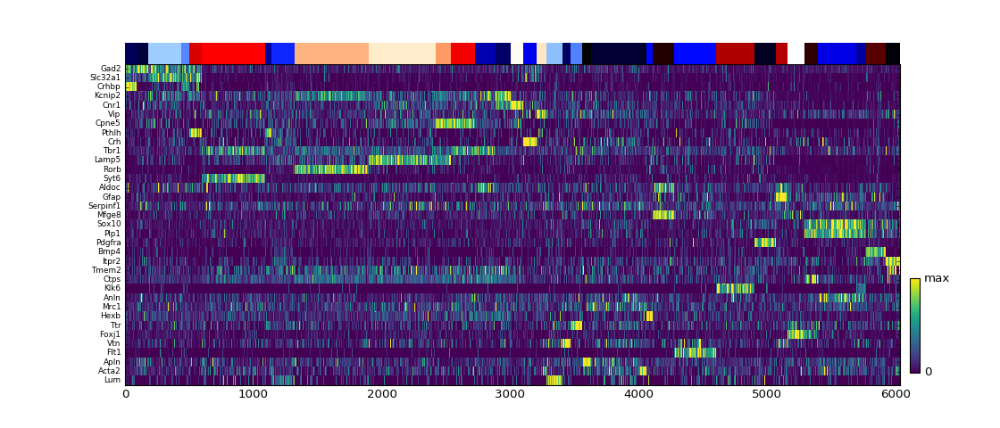

(35, 6036)
6036


In [2599]:
level = 'Level_{}'.format(35)

cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df, np.array(label_matrix.loc[level]))
print(len(np.unique(labels_a)))
heat_map(df, label_matrix.loc[level])

In [2562]:
def mean_expression(df, labels):
    """
    Make dataframe with mean expression
    
    """
    #Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
    for l in np.unique(labels):
        filt = labels == l
        mean = np.array(df.loc[:,filt].T.mean())
        #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
        if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
            df_count_average[l] = mean
    return df_count_average

def heat_map(df, labels, sort=None, save=False, name=''):
    """
    Plot heat_map of a sorted dataframe
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('DF used for plot: {}'.format(df_input_name))
    
    if sort == None:
        #Make df with count averages per cluster
        df_count_average = mean_expression(df, labels)
        #Make optimal sort on average expression of each cluster
        #Transpose, otherwise you are doing it on genes instead of clusters
        D = pdist(df_count_average.T, 'cityblock') #Working well: 'correlation', 'cityblock', 'seuclidean', 'canberra', 'cosine'
        Z = linkage(D, 'ward')
        optimal_Z = optimal_leaf_ordering(Z, D)
        optimal_o = polo.polo.leaves_list(optimal_Z) 
        #In case some clusters are missing
        optimal_order = []
        for i in optimal_o:
            optimal_order.append(df_count_average.columns[i])
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = []
    for i in optimal_order:
        optimal_sort_cells.extend(label_cells[i])
    
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = []
    for i in optimal_sort_cells:
        optimal_sort_labels.append(cell_labels[i])
    
    fig, axHM = plt.subplots(figsize=(14,6))
    #z = df.loc[:,optimal_sort_cells].values
    #z = z/np.percentile(z, 99.5, 1)[:,None]
    
    df_full = df # _fish_log
    z = df_full.values
    z = z/np.percentile(z, 99, 1)[:,None]
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells].values
    print(z.shape)
    
    im = axHM.pcolor(z, cmap='viridis', vmax=1)

    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))
    print(len(labels))
    plt.title(df_input_name)

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)

    optimal_sort_labels = np.array(optimal_sort_labels)
    axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='flag')
        #Colors, see below:
    #axLabel.pcolor(label_colors_rgb) #label_colors_hex
    
    
    
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')
    
    cax = fig.add_axes([.91, 0.13, 0.01, 0.22])
    colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
    colorbar.set_ticklabels(['0', 'max'])
    
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=300)
    
def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to get
    the names of colums and rows)
    `model`(obj): Clustering object
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a


36
DF used for plot: df
Order of clusters: [32, 16, 12, 6, 2, 15, 31, 9, 35, 23, 14, 27, 8, 10, 17, 34, 18, 13, 5, 22, 21, 7, 11, 4, 3, 30, 1, 26, 29, 19, 25, 20, 33, 28, 0, 24]


<IPython.core.display.Javascript object>


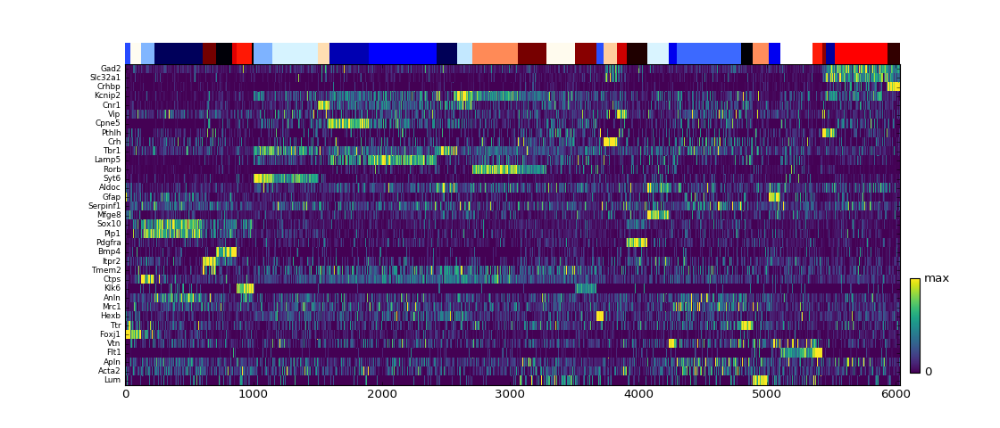

(35, 6036)
6036


In [2585]:
ac_compare = AgglomerativeClustering(n_clusters=36).fit(df_fish_totmol.T)
cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_totmol, ac_compare)
print(len(np.unique(labels_a)))
heat_map(df_fish_totmol, labels_a, save=True, name='AC_totmol_45clust_reference')


<IPython.core.display.Javascript object>


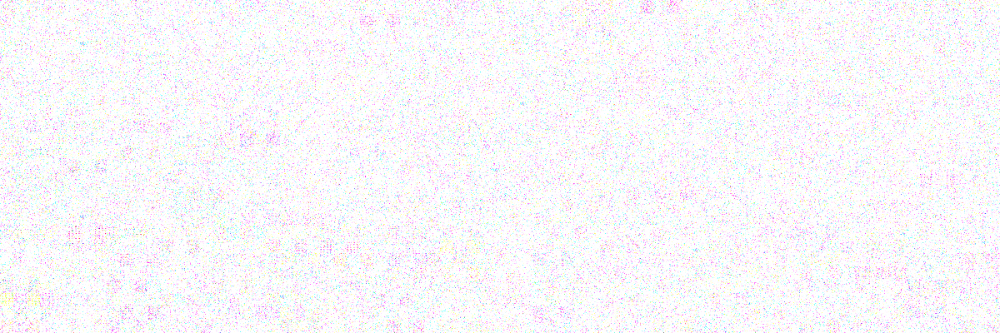

(35, 1785)


In [2448]:
def heatmap_small(df, level, labels_oi=[]):

    plt.figure(figsize=(15,5))
    level = 'Level_{}'.format(level)

    #Heat map
    df_hm = pd.concat([df.loc[:,label_matrix.loc[level] == labels_oi[0]], df.loc[:,label_matrix.loc[level] == labels_oi[1]]], axis=1)
    print(df_hm.shape)
    z = df_hm.values
    z = z/np.percentile(z, 99, 1)[:,None]
    plt.pcolor(z, cmap='viridis', vmax=1)

    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=df_hm.shape[1])
    plt.vlines(Counter(label_matrix.loc[level])[labels_oi[0]], 0, 35, colors='w')

    
heatmap_small(df, 3, [4,5])

In [2369]:
def re_cluster(dfs = []):
    """
    Evaluate a list of clusters (dataframes) by splitting them again and 
    evaluating the daughter clusters.
    Input:
    `dfs`(list): List of Pandas dataframes containing one cluster.
    
    """
    re_evaluation = []
    for d in dfs:
        split = AgglomerativeClustering(n_clusters=2).fit(d.T)
        split_labels = split.labels_ 
        df1 = df_to_split.loc[:,split_labels == np.unique(split_labels)[0]]
        df2 = df_to_split.loc[:,split_labels == np.unique(split_labels)[1]]
        re_evaluation.append(cluster_evaluation(df1, df2, expression_threshold, 
                                                alpha, allow_level_difference=
                                                allow_level_difference)[0])
    return(re_evaluation)  
    
re_cluster([df1, df2])  
    

[[2, 2], [2, 0]]

In [ ]:
def gene_enrichment(df1, df2, threshold):
    """
    Returns a dictionary with for each data frame a list of genes with a 
    mean value above the given threshold.
    Input:
    `df1`(Pandas dataframe): Dataframe of cluster 1
    `df2`(Pandas dataframe): Dataframe of cluster 2
    `threshold`(float): 
    Returns:
    `enriched`(dict): Dictionary with keys "df1" & "df2" with their enriched
        genes as list
    
    """
    enriched = {'df1':df1[df1.mean(axis=1) > 200].index.tolist(),
               'df1': df2[df2.mean(axis=1) > 200].index.tolist()}
    return enriched
    

In [ ]:
def cluster_evaluation(df1, df2, expression_threshold, alpha, allow_level_difference=False):
    
    evaluation = [0,0]
    
    #Investigate if there are genes enriched in a cluster
    enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
    enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()
    
    if enriched_df1 == [] and enriched_df2 == []: #No enriched genes in both groups
        evaluation[0] = 0
    elif enriched_df1 == enriched_df2: #Same enriched genes for both groups, level difference
        if allow_level_difference == True:
            evaluation[0] = 1
        else:
            evaluation[0] = 0
    elif enriched_df1 != enriched_df2: #At least one gene differential enriched
        evaluation[0] = 2
    
    #Test if there is a significant difference in the enriched genes between the groups
    diff_expressed = {'df1':[],
                      'df2':[],
                      'both':[]}
    for gene in [i for i in enriched_df1 if i in enriched_df2]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['both'].append([gene, test_p])
            evaluation[1] = 1
    for gene in [i for i in enriched_df1 if i not in enriched_df2]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['df1'].append([gene, test_p])
            evaluation[1] = 2
    for gene in [i for i in enriched_df2 if i not in enriched_df1]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['df2'].append([gene, test_p])
            evaluation[1] = 2

            
    return evaluation
    

In [2301]:
diff_expressed = {'df1':[],
                      'df2':[],
                      'both':[]}
    
for gene in [i for i in enriched_df1 if i in enriched_df2]:
    test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
    if test_p < difference_threshold:
        diff_expressed['both'].append([gene, test_p])

for gene in [i for i in enriched_df1 if i not in enriched_df2]:
    test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
    if test_p < difference_threshold:
        diff_expressed['df1'].append([gene, test_p])

for gene in [i for i in enriched_df2 if i not in enriched_df1]:
    test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
    if test_p < difference_threshold:
        diff_expressed['df2'].append([gene, test_p])

# tSNE

In [2543]:
df_fish_totmol

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,5162,532,3607,3251,7173,2757,1228,1234,7797,4653
Hybridization2_Gad2,59.097363,134.832042,68.620327,70.789709,634.761084,87.098014,153.993551,18.144337,31.940752,105.881257,...,51.500036,133.533634,103.633295,35.458330,31.192269,32.304901,58.069634,156.791371,102.966098,216.161380
Hybridization12_Slc32a1,45.000240,89.835481,121.920377,75.464881,572.577649,0.000000,58.629915,0.000000,85.125546,0.000000,...,0.000000,59.313587,30.688211,0.000000,0.000000,172.192083,0.000000,0.000000,0.000000,0.000000
Hybridization10_Crhbp,88.751819,0.000000,120.228861,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,139.134971,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Hybridization12_Kcnip2,6.062614,605.149902,821.280234,142.337062,42.076347,187.637373,315.954340,182.414340,80.279197,0.000000,...,462.282422,367.584416,529.208251,0.000000,22.399422,23.198411,0.000000,0.000000,73.940791,310.454484
Hybridization13_Cnr1,20.810705,83.090210,112.766021,488.590357,1348.036639,644.089532,325.366231,313.080398,196.834798,65.249296,...,190.421298,164.580132,709.599886,43.702373,76.888910,119.447318,0.000000,0.000000,0.000000,290.638673
Hybridization6_Vip,315.666957,96.950227,131.576168,162.883024,842.624145,250.509362,189.819776,104.372674,45.933639,101.511102,...,0.000000,704.121834,66.237281,254.961142,44.857254,325.201217,334.037167,150.319946,592.297583,56.519867
Hybridization5_Cpne5,0.000000,537.379320,91.163159,56.427130,38.921070,0.000000,175.356685,650.835825,127.301340,0.000000,...,307.883649,0.000000,458.928081,0.000000,186.477342,0.000000,0.000000,0.000000,410.376132,1253.121666
Hybridization8_Pthlh,171.875731,0.000000,0.000000,0.000000,795.245874,0.000000,223.933462,184.695199,0.000000,0.000000,...,0.000000,0.000000,117.211789,180.469071,0.000000,0.000000,0.000000,0.000000,349.371523,0.000000
Hybridization10_Crh,124.855230,0.000000,338.273677,0.000000,216.633128,0.000000,976.028328,134.167641,0.000000,130.489185,...,190.407571,164.568268,85.145848,131.097667,0.000000,0.000000,0.000000,386.462698,253.793024,0.000000
Hybridization1_Tbr1,85.087324,287.459890,496.524873,131.714267,52.996407,405.145437,238.772319,337.601055,61.906549,20.521568,...,1137.899322,345.080853,232.103448,109.958731,60.455864,62.612330,0.000000,189.085894,478.957475,76.174019


<IPython.core.display.Javascript object>


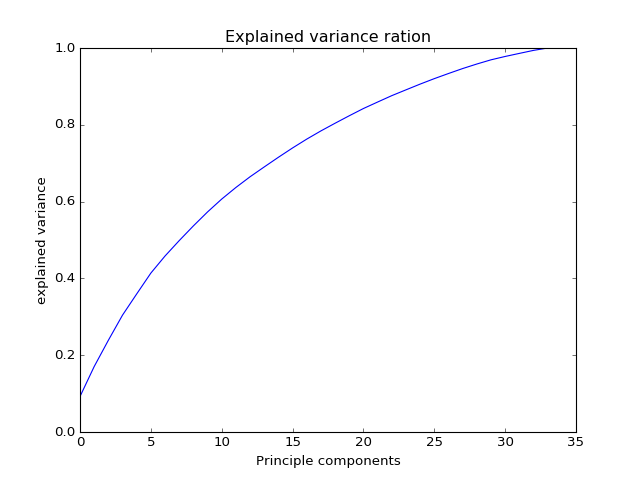

In [2534]:
pca = PCA()
pc = pca.fit_transform(df_fish_totmol.T)

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

In [2538]:
def scatter_tSNE(tSNE_data):
    
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(tSNE_data[:,0], tSNE_data[:,1], lw=0, s=40, alpha = 0.1, c = 'blue')
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('on')
    ax.axis('tight')
    
    return f, ax, sc

<IPython.core.display.Javascript object>


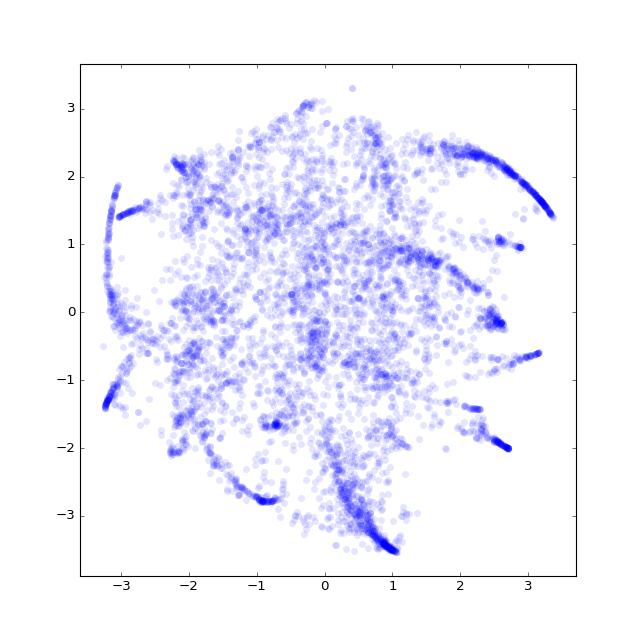

(<matplotlib.figure.Figure at 0x7f9d54ba4978>,
 <matplotlib.collections.PathCollection at 0x7f9d57c9acf8>)

In [2603]:
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15, learning_rate=200, n_iter_without_progress=300)
#Transpose the data to work on the cells
tSNE_points = model.fit_transform(pc[:,:33])
scatter_tSNE(tSNE_points)